# CVAE Loss Balancing

**Author**: Benjamin Urben<br>
**Email**: burben@student.ethz.ch / benjamin.urben@hotmail.ch<br>
**Context**: Master Thesis on "Use of Conditional Variational Autoencoder (cVAE) in the design of connections"<br>
**Institution**: ETH Zürich, Institute of Structural Engineering (IBK)

**Description**:

Investigate the effect different model hyperparameter, as well as the model architecture have on the trained model predictions. Balancing the Loss factors (KL, Reconstruction, L2) has proven to be very delicate and cause instabilites in the training, as the posterior collapse (KL=0) for example.

**Dependencies**: 
- `CVAE.py`
- `DNN.py`
- `Datareader.py`
- `Settings.py`
- `Plot_Functions.py`
- `Saved Models\DNN_trained_model\DNN_trained_model.pth`

## Import

In [1]:
import torch
from sklearn.metrics import silhouette_score
from scipy.stats import gaussian_kde
from scipy.interpolate import interp1d
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random
import copy
import os
import pickle

import importlib

from DataReader import DataReader
from Settings import Directory, Plotting_Parameters
from DNN import DNN
from CVAE import CVAE
from Plot_Functions import plot_MV_interaction

import warnings
warnings.filterwarnings('ignore')

Root Directory set to:  c:\Users\benja\OneDrive\Desktop\Masterarbeit\Code\10_Neural_Networks


In [2]:
plot_params = Plotting_Parameters()
directory = Directory()

Root Directory set to:  c:\Users\benja\OneDrive\Desktop\Masterarbeit\Code\10_Neural_Networks


In [3]:
# Disable if plots should not be saved
plot_params.save_figures = True

## Load Data

In [4]:
datareader = DataReader()
df_full = datareader.load('Knee_Connection_Output_red.csv')

Root Directory set to:  c:\Users\benja\OneDrive\Desktop\Masterarbeit\Code\10_Neural_Networks
Extended_Database_filtered_converted.csv
extended_profiles_iterV2_1.csv
extended_profiles_iter_1.csv
GAL_Generated_Data.csv
Knee_Connection_Output_red.csv
Knee_parallel_I_Off0_Output_red_Q1.xlsx
Knee_parallel_I_Off0_Output_red_Q4.xlsx
Knee_parallel_I_Output_Q1.xlsx
Knee_parallel_I_Output_red_Q4.xlsx
Knee_perpendicular_n.stiff_Off0_Output_red_Q1.xlsx
Knee_perpendicular_n.stiff_Off0_Output_red_Q4.xlsx
Knee_perpendicular_n.stiff_Output_red_Q1.xlsx
Knee_perpendicular_n.stiff_Output_red_Q4.xlsx
Knee_widener_I_Output_Off0_red_Q1.xlsx
Knee_widener_I_Output_red_Q1.xlsx
_OLD
Knee_Connection_Output_red.csv: (714385, 53)


In [5]:
df = df_full.sample(50_000).copy()

In [6]:
model = DNN()
df, _ = datareader.reduce(df_full, model, 5)

Current size: (714385, 53)
Processed column: d_wid
Current size: (363216, 53)
Processed column: t_fwid
Current size: (183926, 53)
Processed column: t_wwid
Current size: (93306, 53)
Processed column: fy_x
Current size: (23518, 53)
Processed column: fy_y


## Load Forward Model

In [7]:
model_name = 'DNN_Model_Full_V3'
MODEL_FORWARD_SAVE_FILE = rf"Saved Models\{model_name}\{model_name}.pth"

model_forward = DNN()
model_forward = torch.load(MODEL_FORWARD_SAVE_FILE)

for key, value in model_forward.config.items():
    print(key, value)

batch_size 256
epochs 2500
learning_rate 0.001
test_size 0.1
val_size 0.1
print_logs True
dropout_prob 0.0
num_layers 3
neurons_per_layer [128, 64, 32, 16, 8]
use_batch_norm True
seed 42
description Different to V2, do not Cat_h & Cath_stiffc features


## Define Features

In [8]:
conditions = ["h_x", "b_x", "tw_x", "tf_x", "fy_x",
              "h_y", "b_y", "tw_y", "tf_y", "fy_y",
              "Offset", "Gamma", "V_norm", "M_norm"]

features = ["t_stiffc", "h_wid", "b_wid"]

In [9]:
features = [feature for feature in features if feature in model.features]

In [10]:
model = CVAE(features, conditions)

# Training parameters
model.config['epochs'] = 500
model.config['learning_rate'] = 0.0005
model.config['batch_size'] = 128

# Architecture parameters
model.config['hidden_dims_encoder'] = [128,64,32]
model.config['hidden_dims_decoder'] = [32,64,128]
model.config['latent_dim'] = 8

# Loss balance parameters
model.config['beta'] = 1.0                  # Initial beta value
model.config['beta_strategy'] = 'constant'  # Options: 'constant', 'annealing', 'loss_balance'
        
model.config['annealing_final_beta'] = None  # Final beta value for annealing
model.config['annealing_start_at'] = None    # Epoch to start annealing
model.config['annealing_steps'] = None       # Number of steps for annealing

model.config['loss_balance_target'] = None  # Target loss for loss balance strategy
model.config['loss_balance_lr'] = None      # Learning rate for loss balance strategy

# Regularization parameters
model.config['L2_factor'] = 0.0

# Stopping criteria
model.config['loss_convergence_stopping'] = None    # If None disabled, otherwise value for patience
model.config['static_stopping'] = None                # If None disabled, otherwise value for patience
model.config['posterior_collapse_stopping'] = True  # If True, enables stopping if posterior collapse is detected

# Log models
model.config['freeze_copy_every_n_epochs'] = None

In [11]:
model.prepare_data(df)
_ = model.build()

Using device: cpu
Number of training samples: 18814
Number of validation samples: 2352
Number of testing samples: 2352
Input dimension: 3
Conditioning dimension: 14


## Experiment 01: Adjust $\beta$

Generally a smaller $\beta$ leads to faster convergence. Larger $\beta$ leaves the risk for posterior collapse. For small values of $\beta$ the KL Loss can be larger than the Reconstrucion Loss.

### Train

In [12]:
experiment_name = 'CVAE_Exp01'
directory.create_folder(f"Saved Models\{experiment_name}")

In [238]:
range_beta = [0.05, 0.1, 0.2, 0.5, 1.0, 2.0, 5.0]

for i,beta in enumerate(range_beta):
    model_sim = copy.deepcopy(model)
    
    model_sim.config['beta'] = beta
    model_sim.config['description'] = f"Variation of constant beta experiment with beta={beta:.2f}"
    
    print(f"Training model with beta: {beta:.2f}")
    
    model_sim.train_model()
    
    # Save the model
    model_name = f"{experiment_name}_{i+1}"
    MODEL_SAVE_PATH = os.path.join(f"Saved Models\{experiment_name}", model_name)
    directory.create_folder(MODEL_SAVE_PATH)

    MODEL_SAVE_FILE = os.path.join(MODEL_SAVE_PATH, f"{model_name}.pth")
    
    model_sim.save(MODEL_SAVE_FILE)

Training model with beta: 0.05
Training on: cpu
Epoch 1/500
  Train Loss: Total = 0.4711, Recon = 0.4228 (89.75%), KL = 0.9654 (10.25%), L2 = 0.0000
  Val Loss: Total = 0.2024, Recon = 0.1434, KL = 1.1794, Beta = 0.0500, KL/Reconstruction Ratio = 0.4111, L2 = 0.0000
Epoch 2/500
  Train Loss: Total = 0.1786, Recon = 0.1198 (67.07%), KL = 1.1762 (32.93%), L2 = 0.0000
  Val Loss: Total = 0.1357, Recon = 0.0762, KL = 1.1904, Beta = 0.0500, KL/Reconstruction Ratio = 0.7813, L2 = 0.0000
Epoch 3/500
  Train Loss: Total = 0.1334, Recon = 0.0746 (55.91%), KL = 1.1760 (44.09%), L2 = 0.0000
  Val Loss: Total = 0.1100, Recon = 0.0520, KL = 1.1604, Beta = 0.0500, KL/Reconstruction Ratio = 1.1157, L2 = 0.0000
Epoch 4/500
  Train Loss: Total = 0.1186, Recon = 0.0625 (52.72%), KL = 1.1217 (47.28%), L2 = 0.0000
  Val Loss: Total = 0.1013, Recon = 0.0466, KL = 1.0933, Beta = 0.0500, KL/Reconstruction Ratio = 1.1733, L2 = 0.0000
Epoch 5/500
  Train Loss: Total = 0.1081, Recon = 0.0545 (50.41%), KL = 1.07

### Load

In [13]:
model_collection = {}
experiment_name = 'CVAE_Exp01'
for model_name in os.listdir(f"Saved Models\{experiment_name}"):
    print(model_name)

    model_sim = CVAE(features, conditions)
    MODEL_SAVE_FILE = os.path.join(f"Saved Models\{experiment_name}", model_name, f"{model_name}.pth")
    model_sim = torch.load(MODEL_SAVE_FILE)

    model_collection[model_sim.config['beta']] = model_sim

CVAE_Exp01_1
CVAE_Exp01_2
CVAE_Exp01_3
CVAE_Exp01_4
CVAE_Exp01_5
CVAE_Exp01_6
CVAE_Exp01_7


### Losses

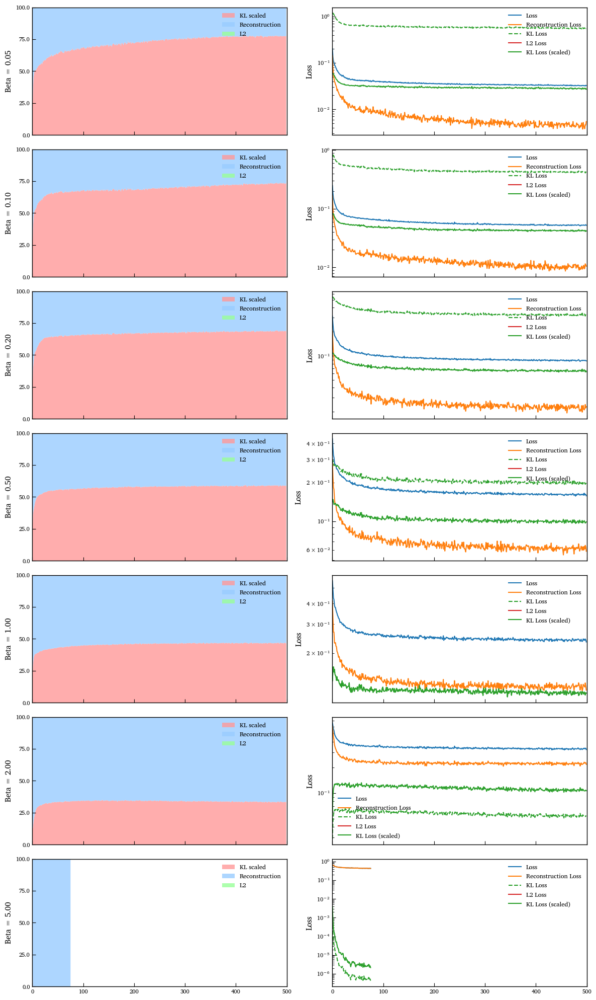

In [10]:
fig, axs = plt.subplots(len(model_collection), 2, figsize=(12, 20), sharex=True)

for i, (beta, model_sim) in enumerate(model_collection.items()):
    total_losses = np.array(model_sim.train_losses['kl']) * np.array(model_sim.val_losses['beta']) + np.array(model_sim.train_losses['reconstruction']) + np.array(model_sim.train_losses['L2'])

    ax = axs[i, 0]
    ax.stackplot(
        np.arange(len(total_losses)),
        np.array(model_sim.train_losses['kl']) * np.array(model_sim.val_losses['beta']) / total_losses,
        np.array(model_sim.train_losses['reconstruction']) / total_losses,
        np.array(model_sim.train_losses['L2']) / total_losses,
        labels=['KL scaled', 'Reconstruction', 'L2'],
        colors=['#FF9999', '#99CCFF', '#99FF99'], # Light Red, Light Blue, Light Green
        alpha=0.8 # Transparency for better visual separation
    )
    ax.set_xlim(0, model_sim.config['epochs'])
    ax.set_yticks(np.linspace(0,1,5),np.linspace(0,100,5))
    ax.set_ylim(0, 1)
    ax.legend()
    ax.set_ylabel(f"Beta = {beta:.2f}")

    ax = axs[i,1]
    ax.plot(model_sim.val_losses['total'], 
            label='Loss', 
            color=plot_params.colors[0])
    ax.plot(model_sim.val_losses['reconstruction'],
            label='Reconstruction Loss', 
            color=plot_params.colors[1])
    ax.plot(model_sim.val_losses['kl'],
            label='KL Loss', 
            linestyle='--',
            color=plot_params.colors[2])
    ax.plot(model_sim.val_losses['L2'],
            label='L2 Loss', 
            color=plot_params.colors[3])
    ax.plot(np.multiply(model_sim.val_losses['kl'],model_sim.val_losses['beta']),
            label='KL Loss (scaled)', 
            color=plot_params.colors[2])
    ax.set_xlim([0,None])
    ax.set_ylabel('Loss')
    ax.set_yscale('log')
    ax.legend()

plt.tight_layout()
plt.show()

### Latent Space

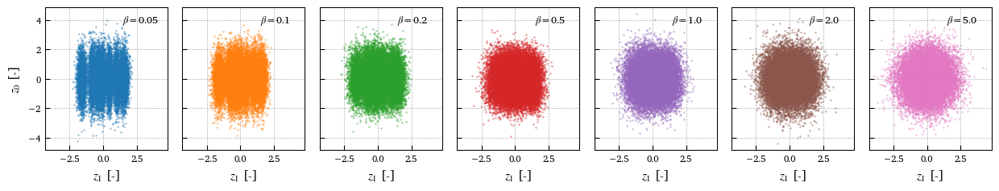

In [ ]:
fig, axs = plt.subplots(1, len(model_collection), figsize=plot_params.get_figsize(2.0,0.4), sharey=True, sharex=True)

for i, (beta, model_sim) in enumerate(model_collection.items()):
    z, z_mean, labels = model_sim.get_latent_space()

    ax = axs[i]
    ax.scatter(z[:, 4], z[:, 0],
                facecolor=plot_params.morecolors[2*i],
                #edgecolor=plot_params.morecolors[2*i],
                s=1.0,
                alpha=0.3,
                zorder=2)
    ax.annotate(rf'$\beta$={beta}', xy=(1.45, 3.8),fontsize=9)
    ax.set_xlabel(r'$z_1$ [-]')
    ax.grid(True, which='both', linestyle='--', linewidth=0.5,zorder=0)
        
axs[0].set_ylabel(r"$z_0$ [-]")

plt.tight_layout()

plt.show()

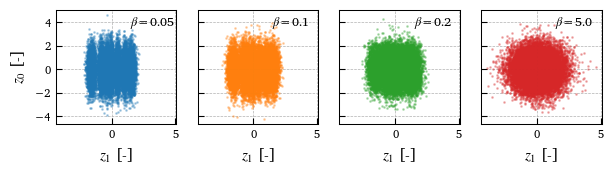

In [28]:
fig, axs = plt.subplots(1, 4, figsize=plot_params.get_figsize(1.0,0.3), sharey=True, sharex=True)

for i,id in enumerate([0,1,2,6]):
    beta = list(model_collection.keys())[id]
    model_sim = model_collection[beta]
    z, z_mean, labels = model_sim.get_latent_space()

    ax = axs[i]
    ax.scatter(z[:, 4], z[:, 0],
                facecolor=plot_params.morecolors[2*i],
                #edgecolor=plot_params.morecolors[2*i],
                s=1.0,
                alpha=0.3,
                zorder=2)
    ax.annotate(rf'$\beta$={beta}', xy=(1.45, 3.7),fontsize=9)
    ax.set_xlabel(r'$z_1$ [-]')
    ax.grid(True, which='both', linestyle='--', linewidth=0.5,zorder=0)
        
axs[0].set_ylabel(r"$z_0$ [-]")

plt.tight_layout()

if plot_params.save_figures:
    plt.savefig(r'Plots\CVAEEXP_LatentSpace.svg', format='svg')

plt.show()

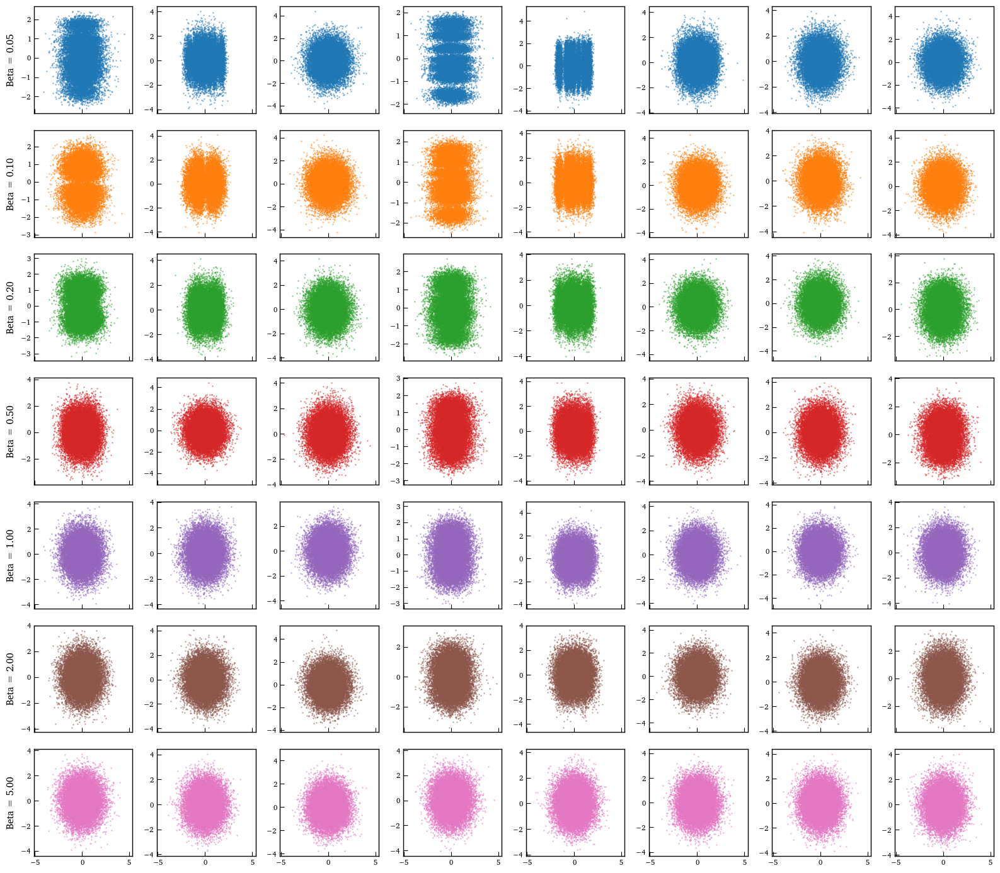

In [19]:
fig, axs = plt.subplots(len(model_collection), model.config['latent_dim'], figsize=(2*model.config['latent_dim'], len(model_collection)*2), sharex=True)

for i, (beta, model_sim) in enumerate(model_collection.items()):
    z, z_mean, labels = model_sim.get_latent_space()

    for j in range(model_sim.config['latent_dim']):
        ax = axs[i,j]
        ax.scatter(z[:, j], z[:, (j+1)%model_sim.config['latent_dim']],
                   c=plot_params.colors[i],
                   s=0.5,
                   alpha=0.5)
        
    axs[i,0].set_ylabel(f"Beta = {beta:.2f}")
        
plt.tight_layout()
plt.show()

### Get all errors

Calculate:
- KL Loss
- Reconstruction Loss
- Reconstruction Error


In [37]:
def get_determinstic_sample(model, base_sample):
    x = base_sample[model.features].values.reshape(1, -1)
    y = base_sample[model.conditions].values.reshape(1, -1)

    x_std = model.scaler_x.transform(x)
    y_std = model.scaler_y.transform(y)

    x_tensor = torch.tensor(x_std, dtype=torch.float32)
    y_tensor = torch.tensor(y_std, dtype=torch.float32)

    mu, logvar = model.encoder(x_tensor, y_tensor)

    # Use the mean (mu) for deterministic sampling
    z = mu

    # Decode to reconstruct input
    x_recon_std = model.decoder(z, y_tensor).detach().numpy()
    x_recon = model.scaler_x.inverse_transform(x_recon_std)

    # Compute per-dimension and per-sample KL divergence
    kl_per_dim = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())
    kl_per_sample = kl_per_dim.sum(dim=1)
    kl_loss = kl_per_sample.mean()

    recon_loss = ((x - x_recon) ** 2).mean()

    return x_recon, x, kl_per_dim.detach().numpy()[0], kl_per_sample.detach().numpy()[0], kl_loss.detach().numpy(), recon_loss

df_test = df.iloc[model_collection[1.0].data['test_data']]
reconstruction_error_collection = {}
kl_loss_per_dim_collection = {}
kl_loss_collection = {}
reconstruction_loss_collection = {}
kl_loss_total = {}
reconstruction_loss_total = {}

for i, (beta, model_sim) in enumerate(model_collection.items()):
    test_deviation = []
    kl_loss_per_dim = []
    kl_loss_per_sample = []
    reconstruction_losses = []

    total_reconstruction_losses = []
    total_kl_losses = []

    # Sample 1000 test data points for evaluation
    for i, base_sample in df_test.sample(1000).iterrows():
        x_recon, x_input, kl_per_dim, kl_per_sample, kl_loss, recon_loss = get_determinstic_sample(model_sim, base_sample)

        # Compute relative deviation (normalized reconstruction error)
        rel_deviation = (x_recon[0] - x_input[0]) / df[features].max().values
        test_deviation.append(rel_deviation)

        # Collect KL loss and reconstruction loss values
        kl_loss_per_dim.append(kl_per_dim)
        kl_loss_per_sample.append(kl_per_sample)
        reconstruction_losses.append(recon_loss)

        total_reconstruction_losses.append(recon_loss)
        total_kl_losses.append(kl_loss)

    # Compute mean loss over all sampled test points
    total_reconstruction_losses = np.mean(total_reconstruction_losses)
    total_kl_losses = np.mean(total_kl_losses)

    kl_loss_total[beta] = total_kl_losses
    reconstruction_loss_total[beta] = total_reconstruction_losses

    test_deviation = np.array(test_deviation)
    kl_loss_per_dim = np.array(kl_loss_per_dim)

    reconstruction_error_collection[beta] = test_deviation
    kl_loss_per_dim_collection[beta] = kl_loss_per_dim
    kl_loss_collection[beta] = kl_loss_per_sample
    reconstruction_loss_collection[beta] = reconstruction_losses

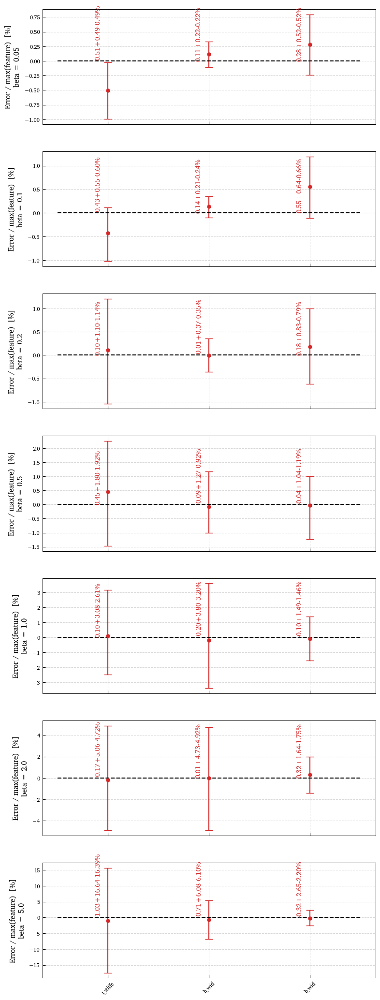

In [38]:
fig, axs = plt.subplots(len(model_collection), 1, figsize=(8, len(model_collection)*3), sharex=True)

for i, (beta, model_sim) in enumerate(model_collection.items()):
    ax = axs[i]
    test_deviation = reconstruction_error_collection[beta]
    for i,feature in enumerate(features):
        error = test_deviation[:,i]

        error_bin_mean = error.mean()

        confidence = 50
        error_lower_val = np.percentile(error, (100 - confidence) / 2)
        error_upper_val = np.percentile(error, confidence + (100 - confidence) / 2)

        error_lower_bound = np.abs(error_bin_mean - error_lower_val)
        error_upper_bound = np.abs(error_upper_val - error_bin_mean)

        error_bounds = np.array([[error_lower_bound], [error_upper_bound]]) * 100

        ax.text(i-0.1, error_bin_mean-0.005, f"{error_bin_mean*100:.2f}+{error_upper_bound*100:.2f}-{error_lower_bound*100:.2f}%", ha='center', va='bottom', fontsize=10, color=plot_params.colors[3], rotation=90)
        ax.errorbar(i, error_bin_mean*100, yerr=error_bounds, fmt='o', color=plot_params.colors[3], markersize=5, capsize=6)

    ax.set_ylabel(f'Error / max(feature)  [%]\nbeta = {beta}')
    ax.set_xticks(np.arange(len(features)))
    ax.set_xticklabels(features, rotation=45)
    ax.hlines(y=0, xmin=-0.5, xmax=len(features)-0.5, color='k', linestyle='--', label='Original')
    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

### MV Interaction Predictions

In [14]:
def sampling(model, profile, n_samples, sample_distance_factor=1, sample_from="prior"):
    model.eval()

    # Standardize input feature vector (x)
    profile_input = profile[model.features].values.reshape(1, -1)
    profile_input_transformed = model.scaler_x.transform(profile_input)
    profile_input_tensor = torch.tensor(profile_input_transformed, dtype=torch.float32).to(model.config["device"])

    # Standardize condition vector (y)
    profile_condition = profile[model.conditions].values.reshape(1, -1)
    profile_condition_transformed = model.scaler_y.transform(profile_condition)
    profile_condition_tensor = torch.tensor(profile_condition_transformed, dtype=torch.float32).to(model.config["device"])


    with torch.no_grad():
        if sample_from == "prior":
            # Sample from standard normal (prior), scaled if needed
            z_samples = torch.randn(n_samples, model.config['latent_dim']).to(model.config["device"]) * sample_distance_factor
        elif sample_from == "posterior":
            # Encode the input feature vector to get the posterior distribution
            mu, logvar = model.encoder(profile_input_tensor, profile_condition_tensor)
            std = torch.exp(0.5 * logvar)
            z_samples = mu + std * torch.randn(n_samples, model.config['latent_dim']).to(model.config["device"]) * sample_distance_factor
        else:
            raise ValueError("sample_from must be either 'prior' or 'posterior'")

        # Repeat condition for each sample
        conditions_repeated = profile_condition_tensor.repeat(n_samples, 1)

        # Decode
        samples = model.decoder(z_samples, conditions_repeated).cpu().numpy()

    samples_transformed = model.scaler_x.inverse_transform(samples)
    df_samples_transformed = pd.DataFrame(samples_transformed, columns=model.features)

    return df_samples_transformed

In [15]:
id = 100
base_sample = df.iloc[id:id+1].copy()
n_samples = 20
generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)
error_collection = {}

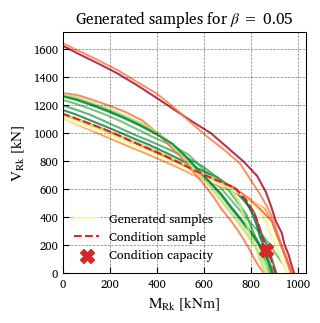

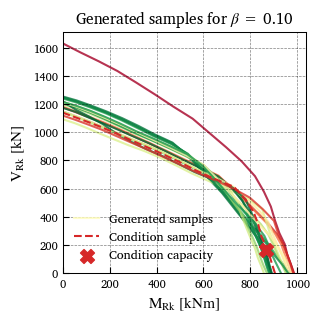

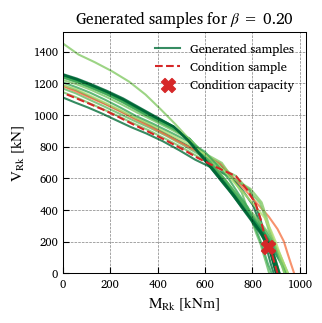

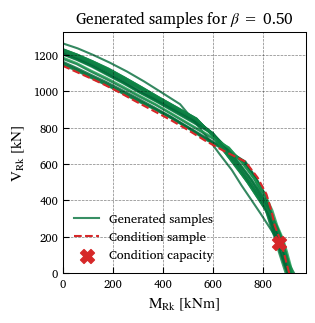

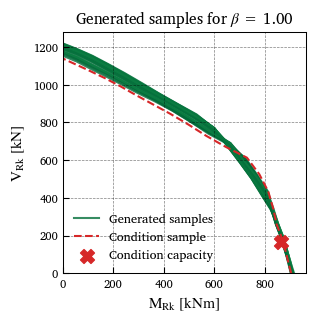

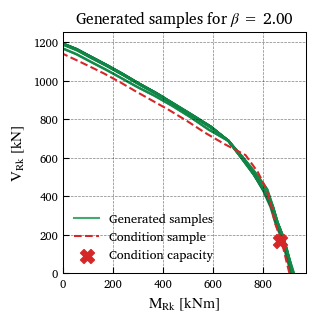

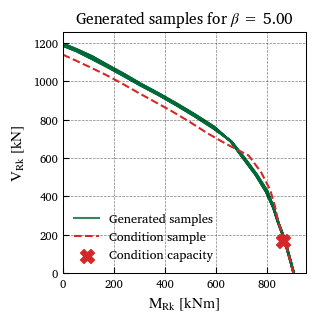

In [17]:
max_error = 0
for k, (beta, model_sim) in enumerate(model_collection.items()):
    generated_features = sampling(model_sim, base_sample, n_samples, sample_distance_factor=1.0, sample_from='prior')
    generated_samples[features] = generated_features.values

    MRd_samples = np.zeros((n_samples, 20))
    VRd_samples = np.zeros((n_samples, 20))

    error = np.zeros(n_samples)

    for i,sample in generated_samples.iterrows():
        MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample,20)
        MRd_samples[i] = MRd_sample
        VRd_samples[i] = VRd_sample

        preds = np.array(list(zip(MRd_sample, VRd_sample)))
        true = np.array(list(zip(base_sample['M_Rd'], base_sample['V_Rd'])))
        orthogonal_distance = np.min(np.linalg.norm(preds - true, axis=1))
        error[i] = orthogonal_distance / np.linalg.norm(true)

    error_collection[beta] = error

    MRd_base, VRd_base, _ = model_forward.get_MV_interaction_prediction(base_sample.iloc[0],20)

    max_error = np.max([max_error, np.max(error)])
    norm = mcolors.Normalize(vmin=np.min(error), vmax=np.max(max_error))
    cmap = plt.cm.RdYlGn_r
    colors = cmap(norm(error))

    fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.5,1))

    for i,(MRd, VRd) in enumerate(zip(MRd_samples, VRd_samples)):
        plt.plot(MRd, VRd, 
                c=colors[i],                      
                label=None if i > 0 else "Generated samples",
                alpha=0.8,
                zorder=0)

    plt.plot(MRd_base, VRd_base,
                color=plot_params.colors[3],
                linestyle='--',
                alpha=1.0,
                zorder=2,
                label="Condition sample")
    
    plt.scatter(base_sample['M_Rd'], base_sample['V_Rd'],
                color=plot_params.colors[3],
                marker='X',
                s=100,
                zorder=3,
                label="Condition capacity")

    plt.legend()
    plt.xlabel(plot_params.feature_labels['M_Rd'])
    plt.ylabel(plot_params.feature_labels['V_Rd'])
    plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5)
    plt.title(rf"Generated samples for $\beta$ = {beta:.2f}")

    plt.xlim([0,None])
    plt.ylim([0,None])

    if plot_params.save_figures:
        plt.savefig(f'Plots\CVAEEXP_Betasamples_{k}.svg', format='svg')

    plt.show()

In [34]:
n_samples = 20
n_base_profiles = 100
ids = random.choices(range(len(df)), k=n_base_profiles)
error_collection = {key: np.zeros((n_base_profiles,n_samples)) for key in model_collection.keys()}
variability_collection = {key: np.zeros((n_base_profiles,n_samples,len(features))) for key in model_collection.keys()}

In [35]:
for _, (beta, model_sim) in enumerate(model_collection.items()):
    for j,id in enumerate(ids):
        base_sample = df.iloc[id:id+1].copy()
        generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)

        generated_features = sampling(model_sim, base_sample, n_samples, sample_distance_factor=1.0, sample_from='prior')
        generated_samples[features] = generated_features.values

        MRd_samples = np.zeros((n_samples, 20))
        VRd_samples = np.zeros((n_samples, 20))

        error = np.zeros(n_samples)

        for i,sample in generated_samples.iterrows():
            MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample,20)
            MRd_samples[i] = MRd_sample
            VRd_samples[i] = VRd_sample

            preds = np.array(list(zip(MRd_sample, VRd_sample)))
            true = np.array(list(zip(base_sample['M_Rd'], base_sample['V_Rd'])))
            orthogonal_distance = np.min(np.linalg.norm(preds - true, axis=1))
            error[i] = orthogonal_distance / np.linalg.norm(true)

        variability_collection[beta][j] = generated_features.values.std(axis=0)
        error_collection[beta][j] = error

### Analyse Reconstruction and KL Loss

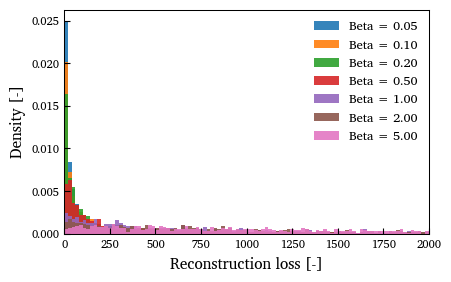

In [ ]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))

all_errors = []
for beta in model_collection.keys():
    all_errors.extend(reconstruction_loss_collection[beta])

min_val, max_val = min(all_errors), 2000
bin_edges = np.linspace(min_val, max_val, 101)

for i, beta in enumerate(model_collection.keys()):
    errors = reconstruction_loss_collection[beta]
    plt.hist(errors,
             bins=bin_edges, 
             alpha=0.9, 
             label=f"Beta = {beta:.2f}",
             color=plot_params.colors[i],
             density=True)

plt.xlim([0,2000])
plt.ylabel('Density [-]')
plt.xlabel('Reconstruction loss [-]')
plt.legend()
plt.show()

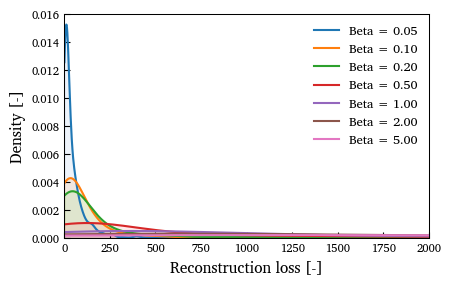

In [42]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))

all_errors = []
error_sets = []

for beta in model_collection.keys():
    errors = reconstruction_loss_collection[beta]
    errors = np.asarray(errors, dtype=np.float64).ravel()
    error_sets.append(errors)
    all_errors.extend(errors)

x_vals = np.linspace(min(all_errors), 2000, 1000)

for i, (beta, errors) in enumerate(zip(model_collection.keys(), error_sets)):
    kde = gaussian_kde(errors)
    density = kde(x_vals)
    plt.plot(x_vals, density, label=f"Beta = {beta:.2f}", color=plot_params.colors[i])
    plt.fill_between(x_vals, density, alpha=0.2, color=plot_params.morecolors[2*i+1])

plt.xlim([0, 2000])
plt.ylim([0, None])
plt.ylabel('Density [-]')
plt.xlabel(r'Reconstruction loss [-]')
plt.legend()

if plot_params.save_figures:
    plt.savefig(r'Plots\CVAEEXP_ReclossDist.svg', format='svg')

plt.show()

#### Reconstruction Error

In [43]:
reconstruction_error = np.array([np.abs(np.array(reconstruction_error_collection[beta])).mean(axis=1).mean() for beta in reconstruction_error_collection.keys()])

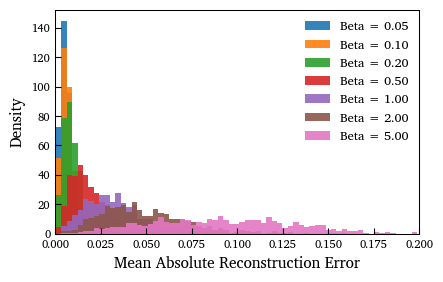

In [44]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))

all_errors = []
for beta in model_collection.keys():
    errors = np.abs(np.array(reconstruction_error_collection[beta])).mean(axis=1)
    all_errors.extend(errors)

min_val, max_val = min(all_errors), max(all_errors)
bin_edges = np.linspace(min_val, max_val, 101)

for i, beta in enumerate(model_collection.keys()):
    errors = np.abs(np.array(reconstruction_error_collection[beta])).mean(axis=1)
    plt.hist(errors,
             bins=bin_edges, 
             alpha=0.9, 
             label=f"Beta = {beta:.2f}",
             color=plot_params.colors[i],
             density=True)

plt.xlim([0, 0.2])
plt.ylabel('Density')
plt.xlabel('Mean Absolute Reconstruction Error')
plt.legend()
plt.show()


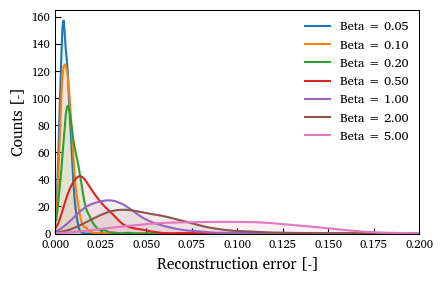

In [45]:


fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))

all_errors = []
error_sets = []

for beta in model_collection.keys():
    errors = np.abs(np.array(reconstruction_error_collection[beta])).mean(axis=1)
    errors = np.asarray(errors, dtype=np.float64).ravel()
    error_sets.append(errors)
    all_errors.extend(errors)

x_vals = np.linspace(min(all_errors), max(all_errors), 500)

for i, (beta, errors) in enumerate(zip(model_collection.keys(), error_sets)):
    kde = gaussian_kde(errors)
    density = kde(x_vals)
    plt.plot(x_vals, density, label=f"Beta = {beta:.2f}", color=plot_params.colors[i])
    plt.fill_between(x_vals, density, alpha=0.2, color=plot_params.morecolors[2*i+1])

plt.xlim([0, 0.2])
plt.ylim([0,None])
plt.ylabel('Counts [-]')
plt.xlabel(r'Reconstruction error [-]')
plt.legend()

if plot_params.save_figures:
    plt.savefig(r'Plots\CVAEEXP_RecError_Dist.svg', format='svg')

plt.show()


#### KL Loss

In [46]:
kl_loss_mean = np.array([np.abs(np.array(kl_loss_collection[beta])).mean() for beta in kl_loss_collection.keys()])

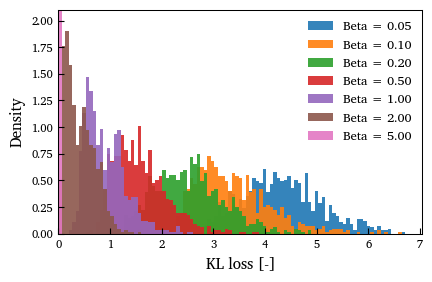

In [47]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))

all_kl_losses = []
for beta in model_collection.keys():

    losses = np.abs(np.array(kl_loss_collection[beta])).ravel()
    all_kl_losses.extend(losses)

bin_edges = np.linspace(min(all_kl_losses), max(all_kl_losses), 101)

for i, beta in enumerate(model_collection.keys()):


    losses = np.abs(np.array(kl_loss_collection[beta])).ravel()
    plt.hist(losses,
             bins=bin_edges, 
             alpha=0.9, 
             label=f"Beta = {beta:.2f}",
             color=plot_params.colors[i],
             density=True)

plt.ylim([0,2.1])
plt.xlim([0,None])
plt.ylabel('Density')
plt.xlabel('KL loss [-]')
plt.legend()
plt.show()


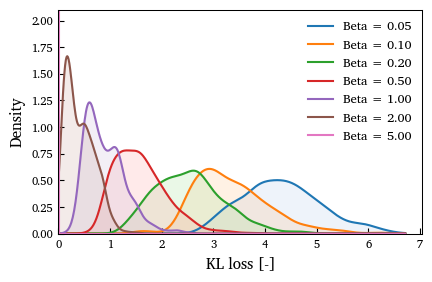

In [ ]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))

all_kl_losses = []
loss_sets = []

for beta in model_collection.keys():
    losses = np.abs(np.array(kl_loss_collection[beta])).ravel()
    losses = np.asarray(losses, dtype=np.float64)
    loss_sets.append(losses)
    all_kl_losses.extend(losses)

x_vals = np.linspace(min(all_kl_losses), max(all_kl_losses), 500)

for i, (beta, losses) in enumerate(zip(model_collection.keys(), loss_sets)):
    kde = gaussian_kde(losses)
    density = kde(x_vals)
    plt.plot(x_vals, density, label=f"Beta = {beta:.2f}", color=plot_params.colors[i])
    plt.fill_between(x_vals, density, alpha=0.2, color=plot_params.morecolors[2*i+1])

plt.ylim([0, 2.1])
plt.xlim([0, None])
plt.ylabel('Density')
plt.xlabel('KL loss [-]')
plt.legend()

if plot_params.save_figures:
    plt.savefig(r'Plots\CVAEEXP_KLDist.svg', format='svg')

plt.show()


#### Combined

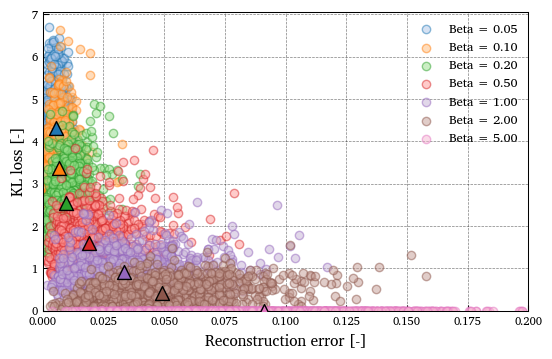

In [49]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(1.0))

for i, beta in enumerate(model_collection.keys()):
    plt.scatter(np.abs(np.array(reconstruction_error_collection[beta])).mean(axis=1),
                np.abs(np.array(kl_loss_collection[beta])),
                label=f"Beta = {beta:.2f}",
                facecolors=plot_params.morecolors[2*i+1],
                edgecolors=plot_params.morecolors[2*i],
                alpha=0.5,
                zorder=2)
    plt.scatter(reconstruction_error[i],
                kl_loss_mean[i],
                marker='^',
                #label=f"Beta = {beta:.2f} (Mean)",
                facecolors=plot_params.colors[i],
                edgecolors='black',
                s=100,
                zorder=3)

plt.legend()
plt.xlabel('Reconstruction error [-]')
plt.ylabel('KL loss [-]')
plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5, zorder=0)
plt.xlim(0, 0.2)
plt.ylim(0, None)

if plot_params.save_figures:
    plt.savefig(r'Plots\CVAEEXP_RecErrorAndKL.svg', format='svg')

plt.show()

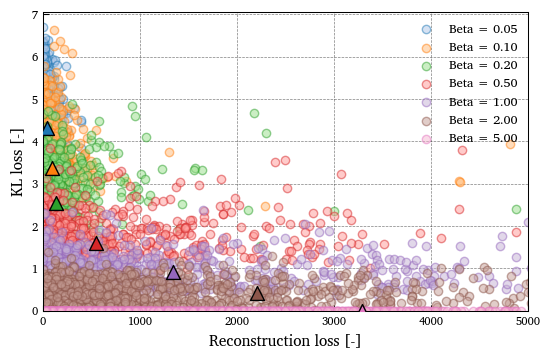

In [50]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(1.0))

for i, beta in enumerate(model_collection.keys()):
    plt.scatter(reconstruction_loss_collection[beta],
                np.abs(np.array(kl_loss_collection[beta])),
                label=f"Beta = {beta:.2f}",
                facecolors=plot_params.morecolors[2*i+1],
                edgecolors=plot_params.morecolors[2*i],
                alpha=0.5,
                zorder=2)
    plt.scatter(np.mean(reconstruction_loss_collection[beta]),
                kl_loss_mean[i],
                marker='^',
                #label=f"Beta = {beta:.2f} (Mean)",
                facecolors=plot_params.colors[i],
                edgecolors='black',
                s=100,
                zorder=3)

plt.xlim(0, 5000)
plt.ylim(0, None)
plt.legend()
plt.xlabel('Reconstruction loss [-]')
plt.ylabel('KL loss [-]')
plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5, zorder=0)

if plot_params.save_figures:
    plt.savefig(r'Plots\CVAEEXP_RecLossAndKL.svg', format='svg')

plt.show()

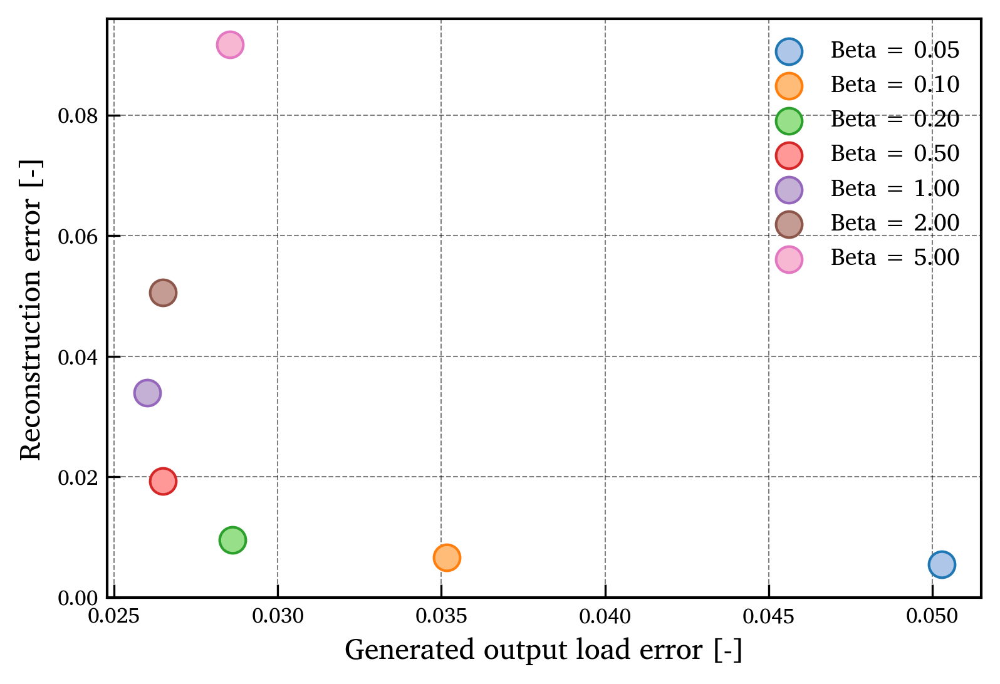

In [233]:
for i, beta in enumerate(model_collection.keys()):
    plt.scatter(np.array(error_collection[beta]).mean(),
                reconstruction_error[i],
                label=f"Beta = {beta:.2f}",
                facecolors=plot_params.morecolors[2*i+1],
                edgecolors=plot_params.morecolors[2*i],
                s=100,
                zorder=3)

plt.legend()
plt.xlabel('Generated output load error [-]')
plt.ylabel('Reconstruction error [-]')
plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5, zorder=0)
plt.xlim(None, None)
plt.ylim(0, None)
plt.show()

#### Total Losses

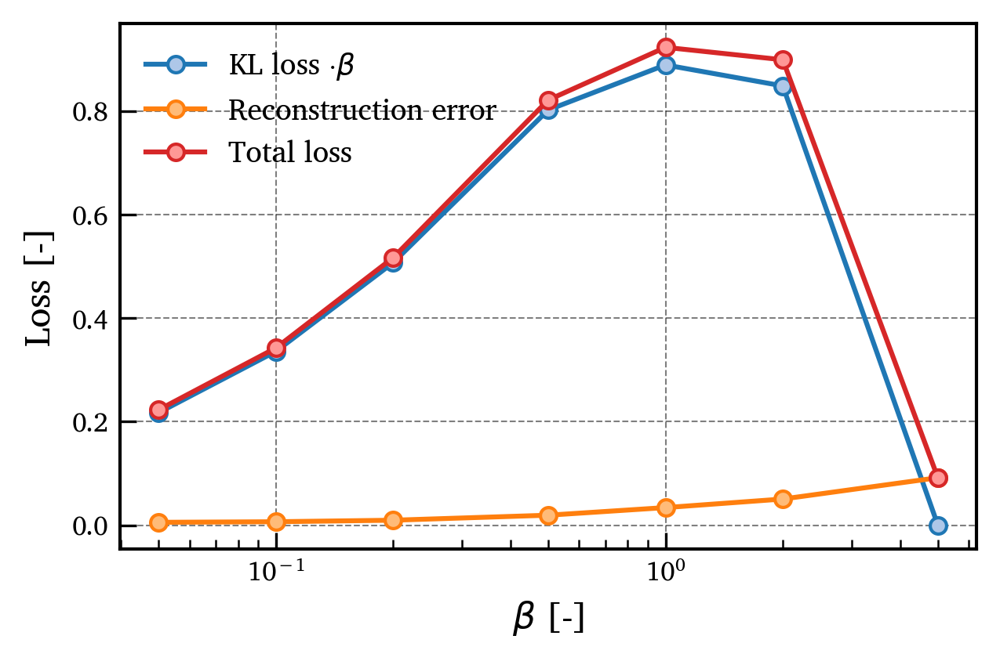

In [235]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))

beta_values = np.array(list(model_collection.keys()))

plt.plot(beta_values,
            kl_loss_mean*beta_values,
            marker='o',
            color=plot_params.morecolors[0],
            markerfacecolor=plot_params.morecolors[1],
            markeredgecolor=plot_params.morecolors[0],
            markersize=5,
            label=r'KL loss $\cdot \beta$')

plt.plot(beta_values,
            reconstruction_error,
            marker='o',
            color=plot_params.morecolors[2],
            markerfacecolor=plot_params.morecolors[3],
            markeredgecolor=plot_params.morecolors[2],
            markersize=5,
            label='Reconstruction error')

plt.plot(beta_values,
            reconstruction_error+kl_loss_mean*beta_values,
            marker='o',
            color=plot_params.morecolors[6],
            markerfacecolor=plot_params.morecolors[7],
            markeredgecolor=plot_params.morecolors[6],
            markersize=5,
            label='Total loss')

plt.legend()
plt.xlabel(r'$\beta$ [-]')
plt.ylabel('Loss [-]')
plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5, zorder=0)
plt.xscale('log')
plt.show()


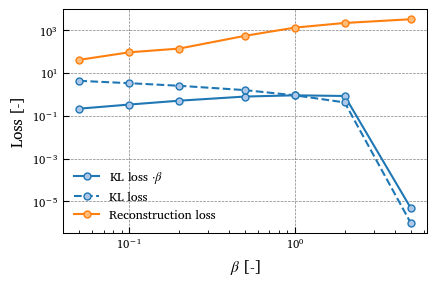

In [52]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))
beta_values = np.array(list(model_collection.keys()))

plt.plot(beta_values,
            np.array(list(kl_loss_total.values()))*beta_values,
            marker='o',
            color=plot_params.morecolors[0],
            markerfacecolor=plot_params.morecolors[1],
            markeredgecolor=plot_params.morecolors[0],
            markersize=5,
            label=r'KL loss $\cdot \beta$')

plt.plot(beta_values,
            np.array(list(kl_loss_total.values())),
            marker='o',
            linestyle='--',
            color=plot_params.morecolors[0],
            markerfacecolor=plot_params.morecolors[1],
            markeredgecolor=plot_params.morecolors[0],
            markersize=5,
            label=r'KL loss')

plt.plot(beta_values,
            reconstruction_loss_total.values(),
            marker='o',
            color=plot_params.morecolors[2],
            markerfacecolor=plot_params.morecolors[3],
            markeredgecolor=plot_params.morecolors[2],
            markersize=5,
            label='Reconstruction loss')

plt.legend()
plt.xlabel(r'$\beta$ [-]')
plt.ylabel('Loss [-]')
plt.yscale('log')
plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5, zorder=0)
plt.xscale('log')

if plot_params.save_figures:
    plt.savefig(r'Plots\CVAEEXP_RecErrorLossProgression.svg', format='svg')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


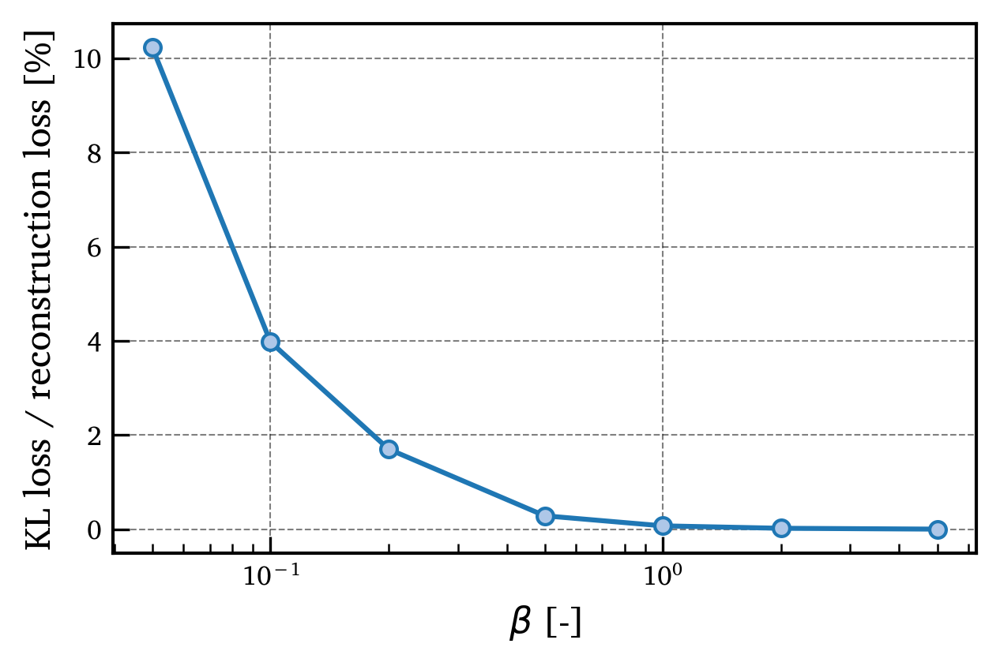

In [265]:
fig, ax = plt.subplots(figsize=plot_params.get_figsize(0.75))
beta_values = np.array(list(model_collection.keys()))

plt.plot(beta_values,
            np.array(list(kl_loss_total.values())) / np.array(list(reconstruction_loss_total.values())) * 100,
            marker='o',
            color=plot_params.morecolors[0],
            markerfacecolor=plot_params.morecolors[1],
            markeredgecolor=plot_params.morecolors[0],
            markersize=5)

plt.legend()
plt.xlabel(r'$\beta$ [-]')
plt.ylabel('KL loss / reconstruction loss [%]')
plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5, zorder=0)
plt.xscale('log')
plt.show()

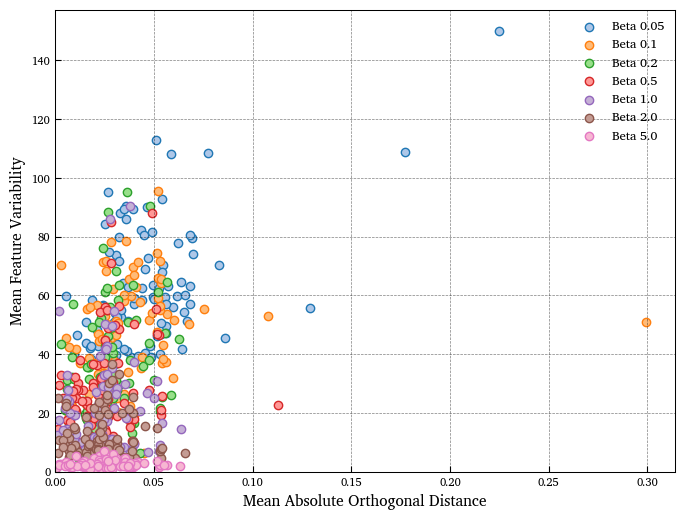

In [53]:
fig, ax = plt.subplots(figsize=(8, 6))

for i, beta in enumerate(model_collection.keys()):
    plt.scatter(error_collection[beta].mean(axis=1), 
                variability_collection[beta].mean(axis=2).mean(axis=1), 
                facecolors=plot_params.morecolors[2*i+1],
                edgecolors=plot_params.morecolors[2*i],
                label=f'Beta {beta}')
    
plt.xlabel('Mean Absolute Orthogonal Distance')
plt.ylabel('Mean Feature Variability')

plt.legend()
plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5, zorder=0)
plt.xlim(0, None)
plt.ylim(0, None)
plt.show()

## Latent Space Dimension

### Training

In [135]:
experiment_name = "CVAE_Exp02"
directory.create_folder(f"Saved Models\{experiment_name}")

In [17]:
range_latent_dim = [4, 8, 16, 32]

for i,latent_dim in enumerate(range_latent_dim):
    model_sim = copy.deepcopy(model)

    model_sim.config['latent_dim'] = latent_dim
    model_sim.config['description'] = f"Variation of latent space dimension. Current latent space dimension = {latent_dim:.2f}"

    print(f"Training model with latent_dim: {latent_dim:.2f}")

    model_sim.train_model()
    
    # Save the model
    model_name = f"{experiment_name}_{i+1}"
    MODEL_SAVE_PATH = os.path.join(f"Saved Models\{experiment_name}", model_name)
    directory.create_folder(MODEL_SAVE_PATH)

    MODEL_SAVE_FILE = os.path.join(MODEL_SAVE_PATH, f"{model_name}.pth")
    
    model_sim.save(MODEL_SAVE_FILE)

Training model with latent_dim: 4.00
Training on: cpu
Epoch 1/500
  Train Loss: Total = 1.5688, Recon = 0.6406 (40.83%), KL = 0.9282 (59.17%), L2 = 0.0000
  Val Loss: Total = 0.6019, Recon = 0.3480, KL = 0.2538, Beta = 1.0000, KL/Reconstruction Ratio = 0.7294, L2 = 0.0000
Epoch 2/500
  Train Loss: Total = 0.5332, Recon = 0.3232 (60.62%), KL = 0.2100 (39.38%), L2 = 0.0000
  Val Loss: Total = 0.4603, Recon = 0.2791, KL = 0.1812, Beta = 1.0000, KL/Reconstruction Ratio = 0.6493, L2 = 0.0000
Epoch 3/500
  Train Loss: Total = 0.4468, Recon = 0.2756 (61.67%), KL = 0.1713 (38.33%), L2 = 0.0000
  Val Loss: Total = 0.4062, Recon = 0.2454, KL = 0.1607, Beta = 1.0000, KL/Reconstruction Ratio = 0.6549, L2 = 0.0000
Epoch 4/500
  Train Loss: Total = 0.4027, Recon = 0.2473 (61.43%), KL = 0.1553 (38.57%), L2 = 0.0000
  Val Loss: Total = 0.3745, Recon = 0.2246, KL = 0.1499, Beta = 1.0000, KL/Reconstruction Ratio = 0.6673, L2 = 0.0000
Epoch 5/500
  Train Loss: Total = 0.3680, Recon = 0.2241 (60.89%), KL 

### Load

In [136]:
model_collection = {}
for model_name in os.listdir(f"Saved Models\{experiment_name}"):
    print(model_name)

    model_sim = CVAE(features, conditions)
    MODEL_SAVE_FILE = os.path.join(f"Saved Models\{experiment_name}", model_name, f"{model_name}.pth")
    model_sim = torch.load(MODEL_SAVE_FILE)

    model_collection[model_sim.config['latent_dim']] = model_sim

CVAE_Exp02_1
CVAE_Exp02_2
CVAE_Exp02_3
CVAE_Exp02_4


### Losses

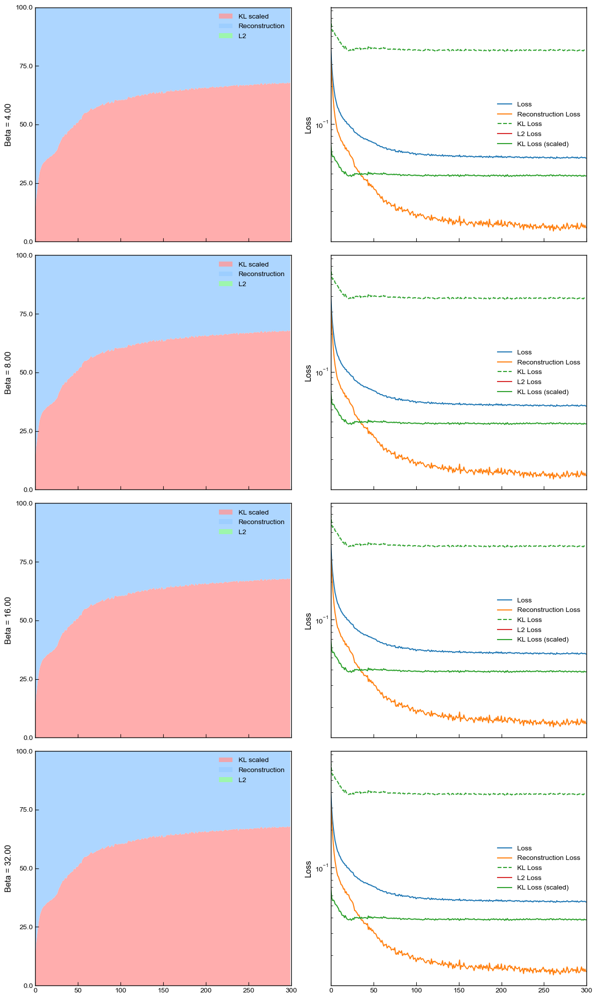

In [137]:
fig, axs = plt.subplots(len(model_collection), 2, figsize=(12, 20), sharex=True)

for i, (beta, model_sim) in enumerate(model_collection.items()):
    total_losses = np.array(model_sim.train_losses['kl']) * np.array(model_sim.val_losses['beta']) + np.array(model_sim.train_losses['reconstruction']) + np.array(model_sim.train_losses['L2'])

    ax = axs[i, 0]
    ax.stackplot(
        np.arange(len(total_losses)),
        np.array(model_sim.train_losses['kl']) * np.array(model_sim.val_losses['beta']) / total_losses,
        np.array(model_sim.train_losses['reconstruction']) / total_losses,
        np.array(model_sim.train_losses['L2']) / total_losses,
        labels=['KL scaled', 'Reconstruction', 'L2'],
        colors=['#FF9999', '#99CCFF', '#99FF99'], # Light Red, Light Blue, Light Green
        alpha=0.8 # Transparency for better visual separation
    )
    ax.set_xlim(0, model_sim.config['epochs'])
    ax.set_yticks(np.linspace(0,1,5),np.linspace(0,100,5))
    ax.set_ylim(0, 1)
    ax.legend()
    ax.set_ylabel(f"Beta = {beta:.2f}")

    ax = axs[i,1]
    ax.plot(model_sim.val_losses['total'], 
            label='Loss', 
            color=plot_params.colors[0])
    ax.plot(model_sim.val_losses['reconstruction'],
            label='Reconstruction Loss', 
            color=plot_params.colors[1])
    ax.plot(model_sim.val_losses['kl'],
            label='KL Loss', 
            linestyle='--',
            color=plot_params.colors[2])
    ax.plot(model_sim.val_losses['L2'],
            label='L2 Loss', 
            color=plot_params.colors[3])
    ax.plot(np.multiply(model_sim.val_losses['kl'],model_sim.val_losses['beta']),
            label='KL Loss (scaled)', 
            color=plot_params.colors[2])
    ax.set_xlim([0,None])
    ax.set_ylabel('Loss')
    ax.set_yscale('log')
    ax.legend()

plt.tight_layout()
plt.show()

### MV Interaction Prediction

In [138]:
id = np.random.randint(0, len(df), 1)[0]
base_sample = df.iloc[id:id+1].copy()
n_samples = 100
generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)

In [139]:
for i, (beta, model_sim) in enumerate(model_collection.items()):
    generated_features = model_sim.sample(base_sample, n_samples=n_samples)
    generated_samples[features] = generated_features.values

    MRd_samples = np.zeros((n_samples, 20))
    VRd_samples = np.zeros((n_samples, 20))

    for i,sample in generated_samples.iterrows():
        MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample,20)
        MRd_samples[i] = MRd_sample
        VRd_samples[i] = VRd_sample

    MRd_base, VRd_base, _ = model_forward.get_MV_interaction_prediction(base_sample.iloc[0],20)

    fig, ax = plt.subplots(figsize=(5, 5))

    for i,(MRd, VRd) in enumerate(zip(MRd_samples, VRd_samples)):
        plt.plot(MRd, VRd, 
                color='blue',                        
                label=None if i > 0 else "Generated Samples",
                alpha=0.5,
                zorder=0)

    plt.plot(MRd_base, VRd_base,
                color='red',
                linestyle='--',
                alpha=1.0,
                zorder=2,
                label="Base Sample")
    
    plt.scatter(base_sample['M_Rd'], base_sample['V_Rd'],
                color='red',
                marker='o',
                s=100,
                zorder=3,
                label="Base Sample Point")

    plt.legend()
    plt.xlabel(r'$M_{Rd}$ $\mathrm{[kNm]}$')
    plt.ylabel(r'$V_{Rd}$ $\mathrm{[kN]}$')
    plt.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5)
    plt.title(f"Generated Samples for Latent Dim = {beta:.2f}")

    plt.xlim([0,None])
    plt.ylim([0,None])
    plt.show()

RuntimeError: mat1 and mat2 shapes cannot be multiplied (100x12 and 16x16)

## Annealing Beta

In [246]:
experiment_name = "CVAE_Exp03"
directory.create_folder(f"Saved Models\{experiment_name}")

### Training

In [ ]:
range_beta_dim = [(0.5, 1),
                  (0.5, 10),
                  (0.5, 100), 
                  (0.5, 500)]

for i,(beta, annealing_steps) in enumerate(range_beta_dim):
    model_sim = copy.deepcopy(model)

    model_sim.config['beta'] = 0.0
    model_sim.config['beta_strategy'] = 'annealing'
    model_sim.config['annealing_final_beta'] = beta  # Final beta value for annealing
    model_sim.config['annealing_start_at'] = 0    # Epoch to start annealing
    model_sim.config['annealing_steps'] = annealing_steps
    model_sim.config['description'] = f"Variation of beta with annealing. Current annealing steps = {annealing_steps:.2f}"

    model_sim.train_model()
    
    # Save the model
    model_name = f"{experiment_name}_{i+1}"
    MODEL_SAVE_PATH = os.path.join(f"Saved Models\{experiment_name}", model_name)
    directory.create_folder(MODEL_SAVE_PATH)

    MODEL_SAVE_FILE = os.path.join(MODEL_SAVE_PATH, f"{model_name}.pth")
    
    model_sim.save(MODEL_SAVE_FILE)

Training on: cpu
Epoch 1/500
  Train Loss: Total = 0.3808, Recon = 0.3808 (100.00%), KL = 6.3139 (0.00%), L2 = 0.0000
  Val Loss: Total = 0.1134, Recon = 0.1134, KL = 7.0247, Beta = 0.0000, KL/Reconstruction Ratio = 0.0000, L2 = 0.0000
Epoch 2/500
  Train Loss: Total = 0.0924, Recon = 0.0924 (2.21%), KL = 8.1922 (97.79%), L2 = 0.0000
  Val Loss: Total = 0.0469, Recon = 0.0469, KL = 9.2430, Beta = 0.5000, KL/Reconstruction Ratio = 0.0000, L2 = 0.0000
Epoch 3/500
  Train Loss: Total = 0.5836, Recon = 0.2369 (40.59%), KL = 0.6934 (59.41%), L2 = 0.0000
  Val Loss: Total = 0.3611, Recon = 0.1938, KL = 0.3347, Beta = 0.5000, KL/Reconstruction Ratio = 0.8634, L2 = 0.0000
Epoch 4/500
  Train Loss: Total = 0.3448, Recon = 0.1873 (54.31%), KL = 0.3151 (45.69%), L2 = 0.0000
  Val Loss: Total = 0.3154, Recon = 0.1591, KL = 0.3126, Beta = 0.5000, KL/Reconstruction Ratio = 0.9821, L2 = 0.0000
Epoch 5/500
  Train Loss: Total = 0.3135, Recon = 0.1651 (52.65%), KL = 0.2969 (47.35%), L2 = 0.0000
  Val L

### Load

In [254]:
model_collection = {}
experiment_name = 'CVAE_Exp03'
for model_name in os.listdir(f"Saved Models\{experiment_name}"):
    print(model_name)

    model_sim = CVAE(features, conditions)
    MODEL_SAVE_FILE = os.path.join(f"Saved Models\{experiment_name}", model_name, f"{model_name}.pth")
    model_sim = torch.load(MODEL_SAVE_FILE)

    model_collection[model_sim.config['beta']] = model_sim

CVAE_Exp03_1
CVAE_Exp03_2
CVAE_Exp03_3
CVAE_Exp03_4


### Losses

ValueError: not enough values to unpack (expected 3, got 2)

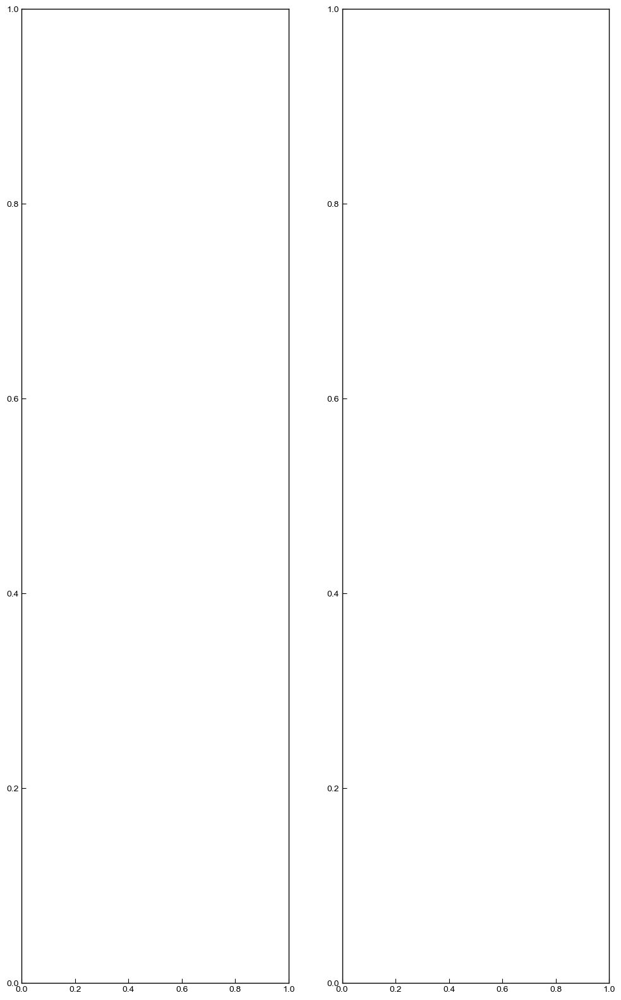

In [257]:
fig, axs = plt.subplots(len(model_collection), 2, figsize=(12, 20), sharex=True)

for i, (beta,annealing_steps, model_sim) in enumerate(model_collection.items()):
    total_losses = np.array(model_sim.train_losses['kl']) * np.array(model_sim.val_losses['beta']) + np.array(model_sim.train_losses['reconstruction']) + np.array(model_sim.train_losses['L2'])

    ax = axs[i, 0]
    ax.stackplot(
        np.arange(len(total_losses)),
        np.array(model_sim.train_losses['kl']) * np.array(model_sim.val_losses['beta']) / total_losses,
        np.array(model_sim.train_losses['reconstruction']) / total_losses,
        np.array(model_sim.train_losses['L2']) / total_losses,
        labels=['KL scaled', 'Reconstruction', 'L2'],
        colors=['#FF9999', '#99CCFF', '#99FF99'], # Light Red, Light Blue, Light Green
        alpha=0.8 # Transparency for better visual separation
    )
    ax.set_xlim(0, model_sim.config['epochs'])
    ax.set_yticks(np.linspace(0,1,5),np.linspace(0,100,5))
    ax.set_ylim(0, 1)
    ax.legend()
    ax.set_ylabel(f"Beta = {beta:.2f}")

    ax = axs[i,1]
    ax.plot(model_sim.val_losses['total'], 
            label='Loss', 
            color=plot_params.colors[0])
    ax.plot(model_sim.val_losses['reconstruction'],
            label='Reconstruction Loss', 
            color=plot_params.colors[1])
    ax.plot(model_sim.val_losses['kl'],
            label='KL Loss', 
            linestyle='--',
            color=plot_params.colors[2])
    ax.plot(model_sim.val_losses['L2'],
            label='L2 Loss', 
            color=plot_params.colors[3])
    ax.plot(np.multiply(model_sim.val_losses['kl'],model_sim.val_losses['beta']),
            label='KL Loss (scaled)', 
            color=plot_params.colors[2])
    ax.set_xlim([0,None])
    ax.set_ylabel('Loss')
    ax.set_yscale('log')
    ax.legend()

plt.tight_layout()
plt.show()

## Investigation into various CVAE behaviors

Negative sampled values if features all == 0, because gaussian does not have a cutoff! Hence all features must be clipped to real values. Make a small sensitivity study for the DNN MV interaction curves with the metrics wonkyness etc. Analyse if there are correlations between the sample error (in the MV interaction curve) and the uncertainty!

#### Build

In [12]:
conditions = ["A_x", "Iy_x", "fy_x",
              "A_y", "Iy_y",  "fy_y",
              "Offset", "Gamma", "V_norm", "M_norm"]

features =["t_stiffc", "h_wid", "b_wid", "d_wid", "t_fwid", "t_wwid"]

In [13]:
model = CVAE(features, conditions)

# Training parameters
model.config['epochs'] = 500
model.config['learning_rate'] = 0.001
model.config['batch_size'] = 128

# Architecture parameters
model.config['hidden_dims_encoder'] = [128,64,32]
model.config['hidden_dims_decoder'] = [128,32,64]
model.config['latent_dim'] = 8

# Loss balance parameters
model.config['beta'] = 0.0                  # Initial beta value
model.config['beta_strategy'] = 'constant' # Options: 'constant', 'annealing', 'loss_balance'
        
model.config['annealing_final_beta'] = 0.2  # Final beta value for annealing
model.config['annealing_start_at'] = 0      # Epoch to start annealing
model.config['annealing_steps'] = 100       # Number of steps for annealing

model.config['loss_balance_target'] = None  # Target loss for loss balance strategy
model.config['loss_balance_lr'] = None      # Learning rate for loss balance strategy

# Regularization parameters
model.config['L2_factor'] = 0.0

# Stopping criteria
model.config['loss_convergence_stopping'] = None    # If None disabled, otherwise value for patience
model.config['static_stopping'] = 50               # If None disabled, otherwise value for patience
model.config['posterior_collapse_stopping'] = True  # If True, enables stopping if posterior collapse is detected

# Log models
model.config['freeze_copy_every_n_epochs'] = None

In [91]:
model.prepare_data(df)
_ = model.build()

Using device: cpu
Number of training samples: 40000
Number of validation samples: 5000
Number of testing samples: 5000
Input dimension: 6
Conditioning dimension: 10


In [92]:
model.train_model()

Training on: cpu
Epoch 1/500
  Train Loss: Total = 0.8548, Recon = 0.8548 (100.00%), KL = 9.5728 (0.00%), L2 = 0.0000
  Val Loss: Total = 0.3435, Recon = 0.3435, KL = 13.5508, Beta = 0.0000, KL/Reconstruction Ratio = 0.0000, L2 = 0.0000
Epoch 2/500
  Train Loss: Total = 0.2429, Recon = 0.2429 (90.60%), KL = 12.5976 (9.40%), L2 = 0.0000
  Val Loss: Total = 0.1426, Recon = 0.1426, KL = 11.0557, Beta = 0.0020, KL/Reconstruction Ratio = 0.0000, L2 = 0.0000
Epoch 3/500
  Train Loss: Total = 0.1326, Recon = 0.1188 (81.24%), KL = 6.8633 (18.76%), L2 = 0.0000
  Val Loss: Total = 0.0880, Recon = 0.0750, KL = 6.5010, Beta = 0.0040, KL/Reconstruction Ratio = 0.1734, L2 = 0.0000
Epoch 4/500
  Train Loss: Total = 0.1011, Recon = 0.0796 (71.17%), KL = 5.3752 (28.83%), L2 = 0.0000
  Val Loss: Total = 0.0719, Recon = 0.0524, KL = 4.8609, Beta = 0.0060, KL/Reconstruction Ratio = 0.3708, L2 = 0.0000
Epoch 5/500
  Train Loss: Total = 0.0842, Recon = 0.0606 (65.72%), KL = 3.9484 (34.28%), L2 = 0.0000
  Va

#### Save Model

In [93]:
model_name = f"CVAE_Test_07"

In [94]:
# Save the model
MODEL_SAVE_PATH = os.path.join("Saved Models", model_name)
directory.create_folder(MODEL_SAVE_PATH)

MODEL_SAVE_FILE = os.path.join(MODEL_SAVE_PATH, f"{model_name}.pth")

model.save(MODEL_SAVE_FILE)

Created folder: Saved Models\CVAE_Test_07
Model saved to: Saved Models\CVAE_Test_07\CVAE_Test_07.pth


#### Load Model

In [38]:
model_name = f"CVAE_Test_05"

model = CVAE(features, conditions)
MODEL_SAVE_FILE = os.path.join(f"Saved Models", model_name, f"{model_name}.pth")
model = torch.load(MODEL_SAVE_FILE)

features = model.features
conditions = model.conditions

print(f"Features: {features}")
print(f"Conditions: {conditions}")

Features: ['t_stiffc', 'h_wid', 'b_wid', 'd_wid', 't_fwid', 't_wwid']
Conditions: ['h_x', 'b_x', 'tw_x', 'tf_x', 'fy_x', 'h_y', 'b_y', 'tw_y', 'tf_y', 'fy_y', 'Offset', 'Gamma', 'V_norm', 'M_norm']


### Analysis

#### Losses

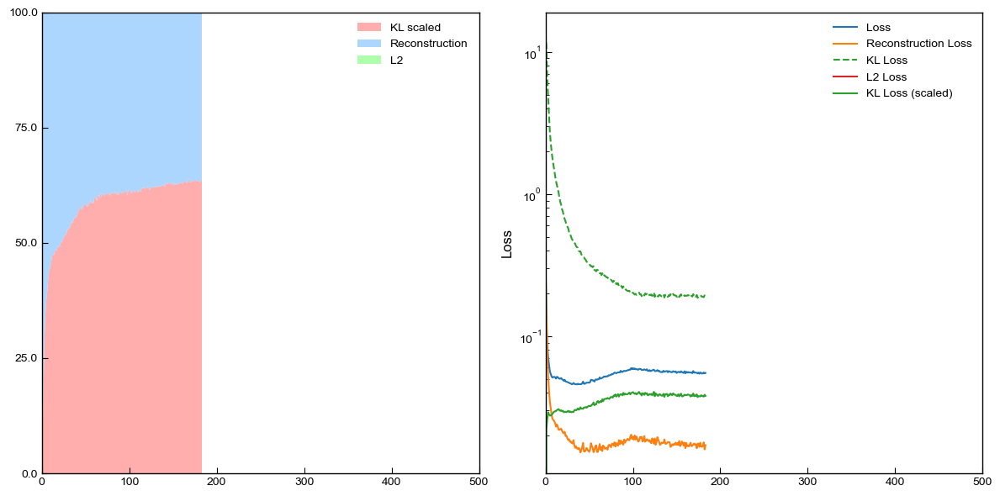

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharex=True)

total_losses = np.array(model.train_losses['kl']) * np.array(model.val_losses['beta']) + np.array(model.train_losses['reconstruction']) + np.array(model.train_losses['L2'])

ax = axs[0]
ax.stackplot(
    np.arange(len(total_losses)),
    np.array(model.train_losses['kl']) * np.array(model.val_losses['beta']) / total_losses,
    np.array(model.train_losses['reconstruction']) / total_losses,
    np.array(model.train_losses['L2']) / total_losses,
    labels=['KL scaled', 'Reconstruction', 'L2'],
    colors=['#FF9999', '#99CCFF', '#99FF99'], # Light Red, Light Blue, Light Green
    alpha=0.8 # Transparency for better visual separation
)
ax.set_xlim(0, model.config['epochs'])
ax.set_yticks(np.linspace(0,1,5),np.linspace(0,100,5))
ax.set_ylim(0, 1)
ax.legend()

ax = axs[1]
ax.plot(model.val_losses['total'], 
        label='Loss', 
        color=plot_params.colors[0])
ax.plot(model.val_losses['reconstruction'],
        label='Reconstruction Loss', 
        color=plot_params.colors[1])
ax.plot(model.val_losses['kl'],
        label='KL Loss', 
        linestyle='--',
        color=plot_params.colors[2])
ax.plot(model.val_losses['L2'],
        label='L2 Loss', 
        color=plot_params.colors[3])
ax.plot(np.multiply(model.val_losses['kl'],model.val_losses['beta']),
        label='KL Loss (scaled)', 
        color=plot_params.colors[2])
ax.set_xlim([0,None])
ax.set_ylabel('Loss')
ax.set_yscale('log')
ax.legend()

plt.tight_layout()
plt.show()

#### Latent Space Illustration

In [17]:
z, z_mean, labels = model.get_latent_space()

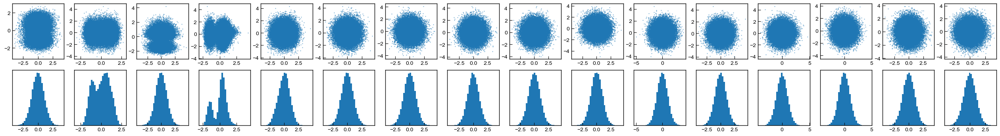

In [18]:
fig, axs = plt.subplots(2, model.config['latent_dim'], figsize=(2*model.config['latent_dim'], 4))

for i in range(model.config['latent_dim']):
    ax = axs[0,i]
    ax.scatter(z[:, i], z[:, (i+1)%model.config['latent_dim']],s=0.5,alpha=0.5)

for i in range(model.config['latent_dim']):
    ax = axs[1,i]
    ax.hist(z[:, i], bins=30)
    ax.set_yticks([])

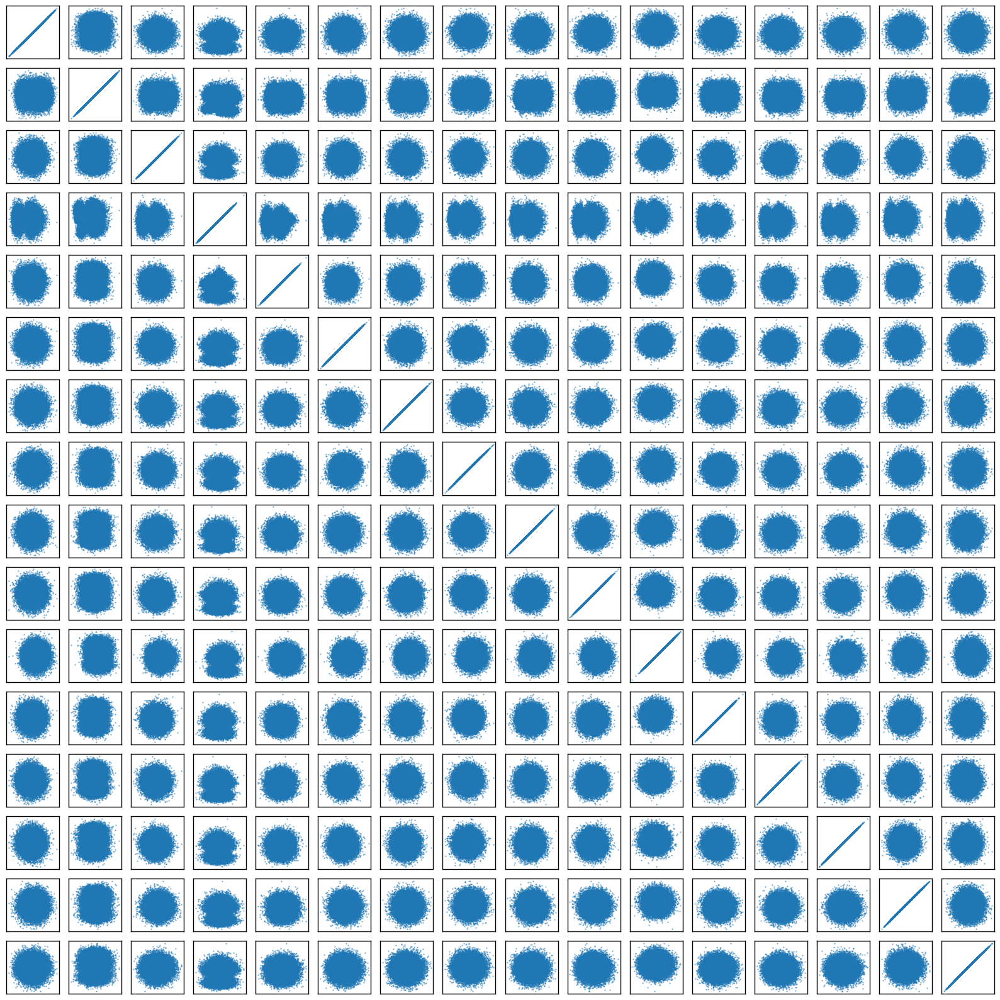

In [19]:
fig, axs = plt.subplots(model.config['latent_dim'], model.config['latent_dim'], figsize=(model.config['latent_dim'], model.config['latent_dim']))

for i in range(model.config['latent_dim']):
    for j in range(model.config['latent_dim']):
        ax = axs[i, j]
        ax.scatter(z[:, i], z[:, j], s=0.5, alpha=0.5)
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

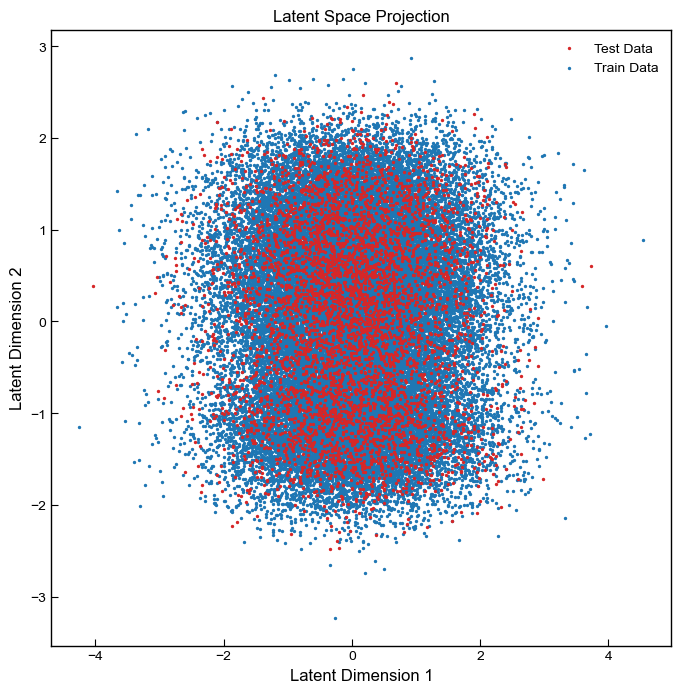

In [178]:
with torch.no_grad():
    mu_test, logvar_test = model.encoder(model.x_test, model.y_test)
    mu_train, logvar_train = model.encoder(model.x_train, model.y_train)

    epsilon = torch.randn_like(mu_test)
    z_test = mu_test + torch.exp(0.5 * logvar_test) * epsilon
    epsilon = torch.randn_like(mu_train)
    z_train = mu_train + torch.exp(0.5 * logvar_train) * epsilon
    
    #z = mu.numpy()
    fig, ax = plt.subplots(figsize=(8, 8))
    plt.scatter(z_test[:, 0], z_test[:, 1], c=plot_params.colors[3], s=2, label='Test Data', zorder=2)
    plt.scatter(z_train[:, 0], z_train[:, 1], c=plot_params.colors[0], s=2, label='Train Data', zorder=0)
    plt.xlabel('Latent Dimension 1')
    plt.ylabel('Latent Dimension 2')
    plt.legend()
    plt.title("Latent Space Projection")

#### Reconstruction Check

Function to clip values to sensible range. Negative features are produced when all conditions = 0, since the multivariate Gaussian does not have a strict cutoff.

In [39]:
def clip(profiles_sampled, df, features, categorical_threshold=10_000):
    profiles_sampled_clipped = profiles_sampled.copy()

    for feature in features:
        if feature in profiles_sampled.columns:
            if df[feature].nunique() < categorical_threshold:

                valid_values = np.sort(df[feature].unique())

                def closest_value(x):
                    idx = np.searchsorted(valid_values, x, side="left")
                    if idx == 0:
                        return valid_values[0]
                    if idx == len(valid_values):
                        return valid_values[-1]
                    lower = valid_values[idx - 1]
                    upper = valid_values[idx]
                    return upper if abs(upper - x) < abs(lower - x) else lower

                profiles_sampled_clipped[feature] = profiles_sampled_clipped[feature].apply(closest_value)

    return profiles_sampled_clipped

Check if the decoder can reconstruct an input.

In [20]:
def get_determinstic_sample(model,base_sample):
    x = base_sample[features].values.reshape(1, -1)
    y = base_sample[conditions].values.reshape(1, -1)

    x_std = model.scaler_x.transform(x)
    y_std = model.scaler_y.transform(y)

    x_tensor = torch.tensor(x_std, dtype=torch.float32)
    y_tensor = torch.tensor(y_std, dtype=torch.float32)

    mu, logvar = model.encoder(x_tensor, y_tensor)
    z = mu
    x_recon_std = model.decoder(z, y_tensor).detach().numpy()
    x_recon = model.scaler_x.inverse_transform(x_recon_std)

    return x_recon, x

In [22]:
id = np.random.randint(len(df))
base_sample = df.iloc[id:id+1].copy()
x_recon, x_input = get_determinstic_sample(model,base_sample)

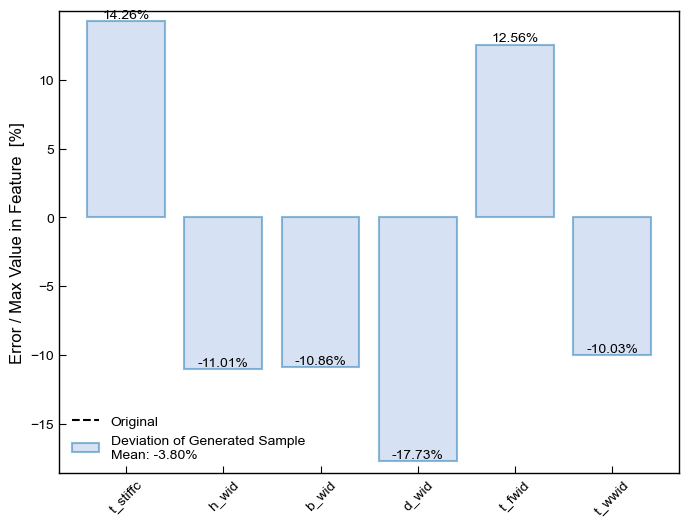

In [23]:
fig, ax = plt.subplots(figsize=(8, 6))  

rel_deviation = (x_recon[0] - x_input[0]) / df[features].max().values

bars = plt.bar(np.arange(len(x_input[0])),
        rel_deviation*100,
        alpha=0.5, 
        label=f'Deviation of Generated Sample\nMean: {np.mean(rel_deviation)*100:.2f}%', 
        facecolor=plot_params.morecolors[1],
        edgecolor=plot_params.colors[0],
        linewidth=1.5)

plt.ylim(1.05*np.min(rel_deviation)*100, 1.05*np.max(rel_deviation)*100)
plt.axhline(y=100, color='k', linestyle='--', label='Original')
plt.ylabel('Error / Max Value in Feature  [%]')

for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
             f"{rel_deviation[i]*100:.2f}%", ha='center', va='bottom')

plt.legend()
plt.xticks(np.arange(len(features)), features, rotation=45)
plt.show()

In [103]:
df_test = df.iloc[model.data['test_data']]
test_deviation = []

for i, base_sample in df_test.sample(1000).iterrows():
    x_recon, x_input = get_determinstic_sample(model,base_sample)

    rel_deviation = (x_recon[0] - (x_input[0])) / df[features].max().values
    test_deviation.append(rel_deviation)

test_deviation = np.array(test_deviation)

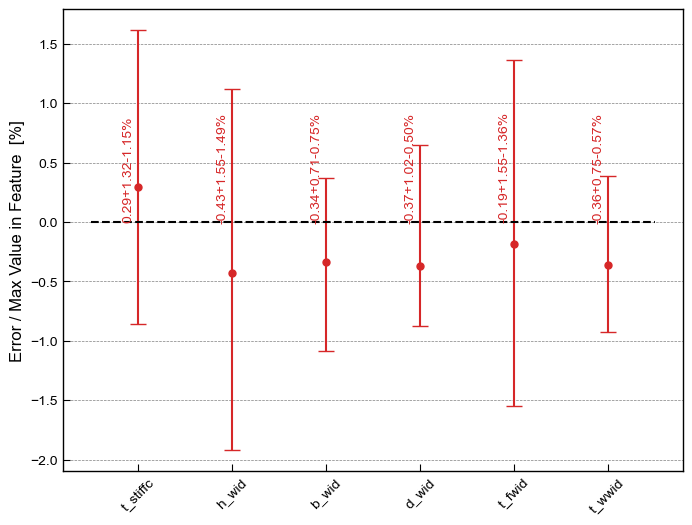

In [104]:
fig, ax = plt.subplots(figsize=(8, 6))

for i,feature in enumerate(features):
    error = test_deviation[:,i]

    error_bin_mean = error.mean()

    confidence = 50
    error_lower_val = np.percentile(error, (100 - confidence) / 2)
    error_upper_val = np.percentile(error, confidence + (100 - confidence) / 2)

    error_lower_bound = np.abs(error_bin_mean - error_lower_val)
    error_upper_bound = np.abs(error_upper_val - error_bin_mean)

    error_bounds = np.array([[error_lower_bound], [error_upper_bound]]) * 100

    ax.text(i-0.1, error_bin_mean-0.005, f"{error_bin_mean*100:.2f}+{error_upper_bound*100:.2f}-{error_lower_bound*100:.2f}%", ha='center', va='bottom', fontsize=10, color=plot_params.colors[3], rotation=90)
    ax.errorbar(i, error_bin_mean*100, yerr=error_bounds, fmt='o', color=plot_params.colors[3], markersize=5, capsize=6)

ax.set_ylabel('Error / Max Value in Feature  [%]')
ax.set_xticks(np.arange(len(features)))
ax.set_xticklabels(features, rotation=45)
ax.hlines(y=0, xmin=-0.5, xmax=len(features)-0.5, color='k', linestyle='--', label='Original')

plt.grid(True, axis='y', which='both', color='k', linestyle='--', linewidth=0.5, alpha=0.5)

plt.show()

#### Variability Check

Check the the MV predictions of the samples. For a well trained CVAE they should fulfill two criteria:

- Intersect the base M/V coordinate, which served as a condition for sampling with the decoder. 
- Have enough variation in predictions.

In [40]:
def sampling(model, profile, n_samples, sample_distance_factor=1, sample_from="prior"):
    model.eval()

    # Standardize input feature vector (x)
    profile_input = profile[model.features].values.reshape(1, -1)
    profile_input_transformed = model.scaler_x.transform(profile_input)
    profile_input_tensor = torch.tensor(profile_input_transformed, dtype=torch.float32).to(model.config["device"])

    # Standardize condition vector (y)
    profile_condition = profile[model.conditions].values.reshape(1, -1)
    profile_condition_transformed = model.scaler_y.transform(profile_condition)
    profile_condition_tensor = torch.tensor(profile_condition_transformed, dtype=torch.float32).to(model.config["device"])


    with torch.no_grad():
        if sample_from == "prior":
            # Sample from standard normal (prior), scaled if needed
            z_samples = torch.randn(n_samples, model.config['latent_dim']).to(model.config["device"]) * sample_distance_factor
        elif sample_from == "posterior":
            # Encode the input feature vector to get the posterior distribution
            mu, logvar = model.encoder(profile_input_tensor, profile_condition_tensor)
            std = torch.exp(0.5 * logvar)
            z_samples = mu + std * torch.randn(n_samples, model.config['latent_dim']).to(model.config["device"]) * sample_distance_factor
        else:
            raise ValueError("sample_from must be either 'prior' or 'posterior'")

        # Repeat condition for each sample
        conditions_repeated = profile_condition_tensor.repeat(n_samples, 1)

        # Decode
        samples = model.decoder(z_samples, conditions_repeated).cpu().numpy()

    samples_transformed = model.scaler_x.inverse_transform(samples)
    df_samples_transformed = pd.DataFrame(samples_transformed, columns=model.features)

    return df_samples_transformed

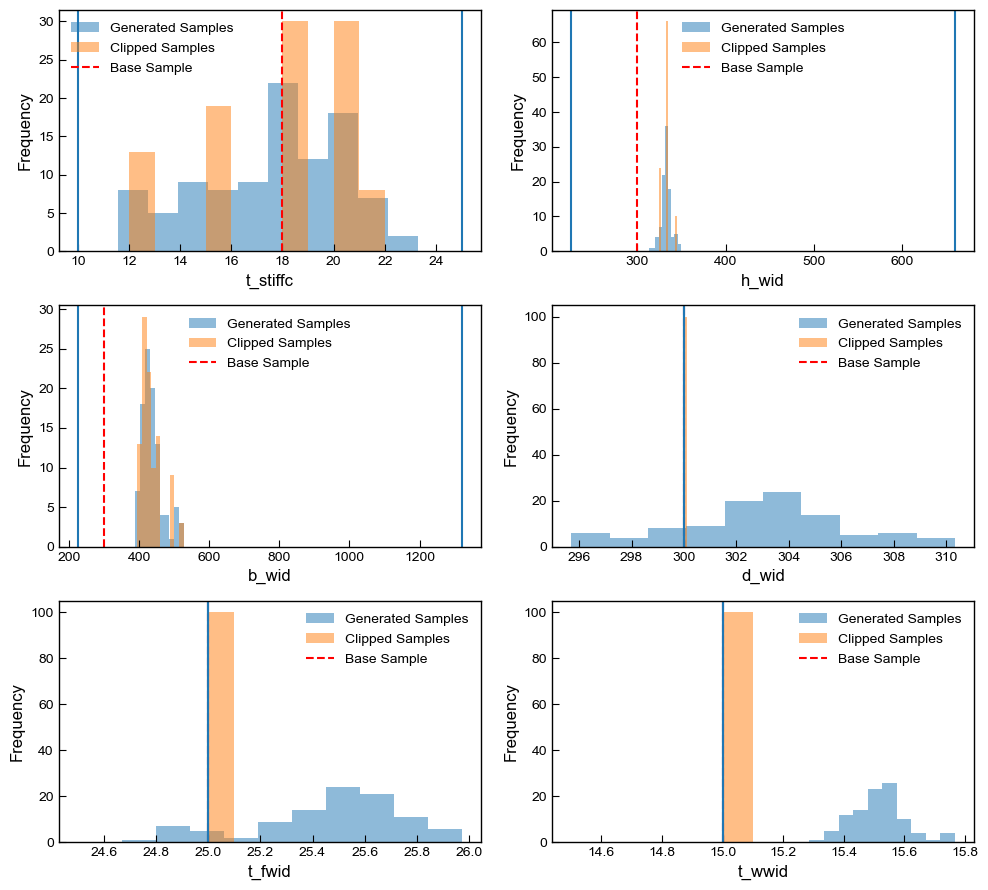

In [25]:
id = np.random.randint(0, len(df), 1)[0]
base_sample = df.iloc[id:id+1].copy()
n_samples = 100
generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)
generated_features = sampling(model, base_sample, n_samples=n_samples, sample_from='posterior')
generated_samples[features] = generated_features.values

generated_samples_clipped = clip(generated_samples, df, features)

fig, axs = plt.subplots(int(len(features)/2), 2, figsize=(10,int(len(features)/2)*3))

for i,feature in enumerate(features):
    ax = axs[int(i/2), i%2]
    ax.hist(generated_samples[feature], alpha=0.5, label='Generated Samples', color=plot_params.colors[0])
    ax.hist(generated_samples_clipped[feature], alpha=0.5, label='Clipped Samples', color=plot_params.colors[1])
    ax.axvline(base_sample[feature].values[0], color='red', linestyle='--', label='Base Sample')
    ax.set_xlabel(feature)
    ax.set_ylabel('Frequency')
    ax.legend()

    ax.axvline(df[feature].min())
    ax.axvline(df[feature].max())
    #ax.set_xlim(df[feature].min()*0.8, df[feature].max()*1.2)

plt.tight_layout()
plt.show()

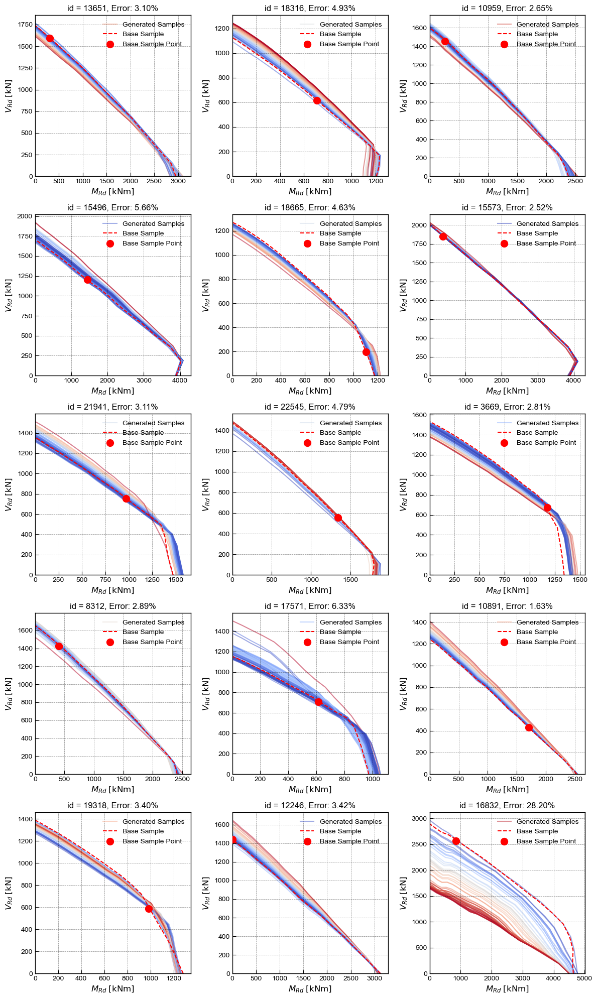

In [26]:
fig, axs = plt.subplots(5,3, figsize=(12, 20))

for i in range(5):
    for j in range(3):
        ax = axs[i,j]

        id = np.random.randint(0, len(df), 1)[0]
        base_sample = df.iloc[id:id+1].copy()
        n_samples = 50
        generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)

        generated_features = sampling(model, base_sample, n_samples=n_samples, sample_distance_factor=1.0, sample_from='posterior')
        generated_samples[features] = generated_features.values

        #generated_samples = clip(generated_samples, df, features)

        MRd_samples = np.zeros((n_samples, 20))
        VRd_samples = np.zeros((n_samples, 20))

        MRd_base, VRd_base, _ = model_forward.get_MV_interaction_prediction(base_sample.iloc[0],20)
        error = np.zeros(n_samples)

        for k,sample in generated_samples.iterrows():
            MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample,20)
            MRd_samples[k] = MRd_sample
            VRd_samples[k] = VRd_sample

            preds = np.array(list(zip(MRd_sample, VRd_sample)))
            true = np.array(list(zip(base_sample['M_Rd'], base_sample['V_Rd'])))
            orthogonal_distance = np.min(np.linalg.norm(preds - true, axis=1))
            error[k] = orthogonal_distance / np.linalg.norm(true)

        norm = mcolors.Normalize(vmin=np.min(error), vmax=np.max(error))
        cmap = plt.cm.coolwarm
        colors = cmap(norm(error))

        for k,(MRd, VRd) in enumerate(zip(MRd_samples, VRd_samples)):
            ax.plot(MRd, VRd, 
                    color=colors[k],                        
                    label=None if k > 0 else "Generated Samples",
                    alpha=0.5,
                    zorder=0)
            
            #ax.set_xlim([0, max(max(MRd),max(VRd))*1.1])
            #ax.set_ylim([0, max(max(MRd),max(VRd))*1.1])

        ax.plot(MRd_base, VRd_base,
                    color='red',
                    linestyle='--',
                    alpha=1.0,
                    zorder=2,
                    label="Base Sample")

        ax.scatter(base_sample['M_Rd'], base_sample['V_Rd'],
                    color='red',
                    marker='o',
                    s=100,
                    zorder=3,
                    label="Base Sample Point")

        ax.legend()
        ax.set_xlabel(r'$M_{Rd}$ $\mathrm{[kNm]}$')
        ax.set_ylabel(r'$V_{Rd}$ $\mathrm{[kN]}$')
        ax.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5)
        ax.set_title(f"id = {id}, Error: {np.mean(error)*100:.2f}%")

        ax.set_xlim([0,None])
        ax.set_ylim([0,None])

plt.tight_layout()
plt.show()

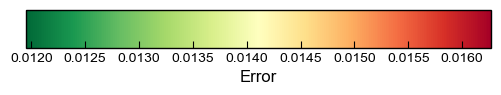

In [208]:
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

# Create a ScalarMappable and plot the colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlGn_r, norm=norm)

cbar = plt.colorbar(sm, cax=ax, orientation='horizontal')
cbar.set_label('Error')
plt.show()

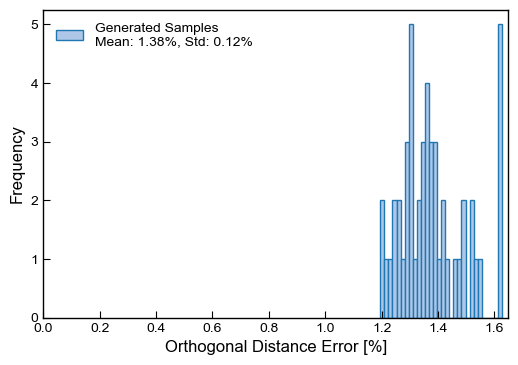

In [209]:
fig, ax = plt.subplots(figsize=(6, 4))

plt.hist(error*100, bins=30, 
         facecolor=plot_params.morecolors[1], 
         edgecolor=plot_params.morecolors[0],
         label=f'Generated Samples\nMean: {np.mean(error)*100:.2f}%, Std: {np.std(error)*100:.2f}%',)

plt.legend()
plt.xlabel('Orthogonal Distance Error [%]')
plt.ylabel('Frequency')
plt.xlim([0, None])
plt.show()

#### MV Predictions for various Loads

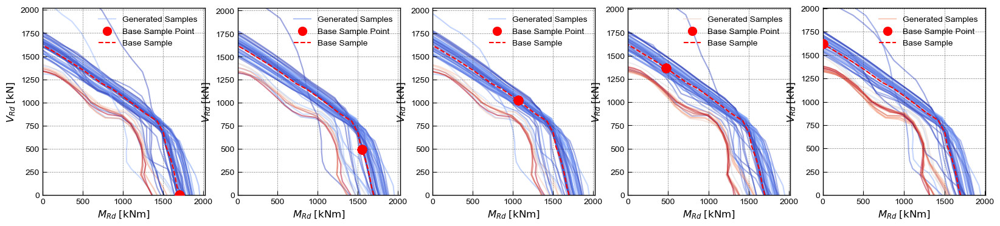

In [26]:
n_loads = 5

fig, axs = plt.subplots(1,n_loads, figsize=(20, 4))

id = np.random.randint(0, len(df), 1)[0]
n_samples = 50

M_contribution = np.linspace(1, 0, n_loads)
V_contribution = np.linspace(0, 1, n_loads)

V_cont = V_contribution / np.sqrt(M_contribution**2 + V_contribution**2)
M_cont = M_contribution / np.sqrt(M_contribution**2 + V_contribution**2)

for i in range(n_loads):
    base_sample = df.iloc[id:id+1].copy()
    base_sample['M_contribution'] = M_cont[i]
    base_sample['V_contribution'] = V_cont[i]

    base_target, _ = model_forward.predict(base_sample)
    base_sample['M_Rd'] = base_target.numpy()[0][0] * base_sample['M_contribution'] * base_sample['Mpl_y']
    base_sample['V_Rd'] = base_target.numpy()[0][0] * base_sample['V_contribution'] * base_sample['Vpl_y']
    base_sample['M_norm'] = base_sample['M_Rd'] / base_sample['Mpl_y']
    base_sample['V_norm'] = base_sample['V_Rd'] / base_sample['Vpl_y']

    generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)

    generated_features = sampling(model, base_sample, n_samples=n_samples, sample_distance_factor=1.0)
    generated_samples[features] = generated_features.values

    MRd_samples = np.zeros((n_samples, 20))
    VRd_samples = np.zeros((n_samples, 20))

    MRd_base, VRd_base, _ = model_forward.get_MV_interaction_prediction(base_sample.iloc[0],20)
    error = np.zeros(n_samples)

    for k,sample in generated_samples.iterrows():
        MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample,20)
        MRd_samples[k] = MRd_sample
        VRd_samples[k] = VRd_sample

        preds = np.array(list(zip(MRd_sample, VRd_sample)))
        true = np.array(list(zip(MRd_base, VRd_base)))
        orthogonal_distance = np.min(np.linalg.norm(preds - true, axis=1))
        error[k] = orthogonal_distance / np.linalg.norm(true)

    norm = mcolors.Normalize(vmin=np.min(error), vmax=np.max(error))
    cmap = plt.cm.coolwarm
    colors = cmap(norm(error))

    ax = axs[i]

    for k,(MRd, VRd) in enumerate(zip(MRd_samples, VRd_samples)):
        ax.plot(MRd, VRd, 
                color=colors[k],                        
                label=None if k > 0 else "Generated Samples",
                alpha=0.5,
                zorder=0)
        
        ax.scatter(base_sample['M_Rd'], base_sample['V_Rd'],
                color='red',
                marker='o',
                s=100,
                zorder=3,
                label="Base Sample Point" if k == 0 else None)
        
        ax.set_xlim([0, max(max(MRd),max(VRd))*1.1])
        ax.set_ylim([0, max(max(MRd),max(VRd))*1.1])

    ax.plot(MRd_base, VRd_base,
                color='red',
                linestyle='--',
                alpha=1.0,
                zorder=2,
                label="Base Sample")

    ax.legend()
    ax.set_xlabel(r'$M_{Rd}$ $\mathrm{[kNm]}$')
    ax.set_ylabel(r'$V_{Rd}$ $\mathrm{[kN]}$')
    ax.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5)

plt.show()

#### Interactive Load Conditioning

In [41]:
import matplotlib.colors as mcolors
import ipywidgets as widgets
from IPython.display import display

In [48]:
id = np.random.randint(0, len(df), 1)[0]
base_sample = df.iloc[id:id+1].copy()

def plot_interaction(M_contribution):
    V_contribution = 1 - M_contribution
    norm_factor = np.sqrt(M_contribution**2 + V_contribution**2)
    M_cont = M_contribution / norm_factor
    V_cont = V_contribution / norm_factor

    n_samples = 50

    base_sample['M_contribution'] = M_cont
    base_sample['V_contribution'] = V_cont

    base_target, _ = model_forward.predict(base_sample)
    base_sample['M_Rd'] = base_target.numpy()[0][0] * base_sample['M_contribution'] * base_sample['Mpl_y']
    base_sample['V_Rd'] = base_target.numpy()[0][0] * base_sample['V_contribution'] * base_sample['Vpl_y']
    base_sample['M_norm'] = base_sample['M_Rd'] / base_sample['Mpl_y']
    base_sample['V_norm'] = base_sample['V_Rd'] / base_sample['Vpl_y']

    generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)

    generated_features = sampling(model, base_sample, n_samples=n_samples, sample_distance_factor=1.0, sample_from='posterior')
    generated_samples[features] = generated_features.values

    MRd_samples = np.zeros((n_samples, 20))
    VRd_samples = np.zeros((n_samples, 20))

    MRd_base, VRd_base, _ = model_forward.get_MV_interaction_prediction(base_sample.iloc[0], 20)
    error = np.zeros(n_samples)

    for k, sample in generated_samples.iterrows():
        MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample, 20)
        MRd_samples[k] = MRd_sample
        VRd_samples[k] = VRd_sample
        preds = np.array(list(zip(MRd_sample, VRd_sample)))
        true = np.array(list(zip(MRd_base, VRd_base)))
        orthogonal_distance = np.min(np.linalg.norm(preds - true, axis=1))
        error[k] = orthogonal_distance / np.linalg.norm(true)

    norm = mcolors.Normalize(vmin=np.min(error), vmax=np.max(error))
    cmap = plt.cm.coolwarm
    colors = cmap(norm(error))

    fig, ax = plt.subplots(figsize=(6, 6))

    for k, (MRd, VRd) in enumerate(zip(MRd_samples, VRd_samples)):
        ax.plot(MRd, VRd, color=colors[k], alpha=0.5, zorder=0)
        ax.scatter(base_sample['M_Rd'], base_sample['V_Rd'], color='red', marker='o', s=100, zorder=3)

    ax.plot(MRd_base, VRd_base, color='red', linestyle='--', alpha=1.0, zorder=2)
    #ax.set_xlim([0, max(MRd_base.max(), VRd_base.max()) * 1.1])
    #ax.set_ylim([0, max(MRd_base.max(), VRd_base.max()) * 1.1])
    ax.set_xlabel(r'$M_{Rd}$ $\mathrm{[kNm]}$')
    ax.set_ylabel(r'$V_{Rd}$ $\mathrm{[kN]}$')
    ax.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5)
    plt.show()

slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.05, description='M_contribution')
ui = widgets.VBox([slider])
out = widgets.interactive_output(plot_interaction, {'M_contribution': slider})

display(ui, out)

Output()

## Error Correlation

Investigate the:

- Reconstruction Error: How much a deterministic sample deviates from its original input

- Sample Error: How much the MV interaction curve deviates from the input (both DNN and CVAE contribute)

In [ ]:
ids = random.choices(range(len(df)), k=100000)
df_choices = df.iloc[ids].copy()

### Reconstruction Error

In [85]:
reconstruction_deviation = []

upper_bounds = df[features].max().values
for i, base_sample in df_choices.iterrows():
    x_recon, x_input = get_determinstic_sample(model,base_sample)

    rel_deviation = (x_recon[0] - (x_input[0])) / upper_bounds
    reconstruction_deviation.append(rel_deviation)

reconstruction_deviation = np.array(reconstruction_deviation)

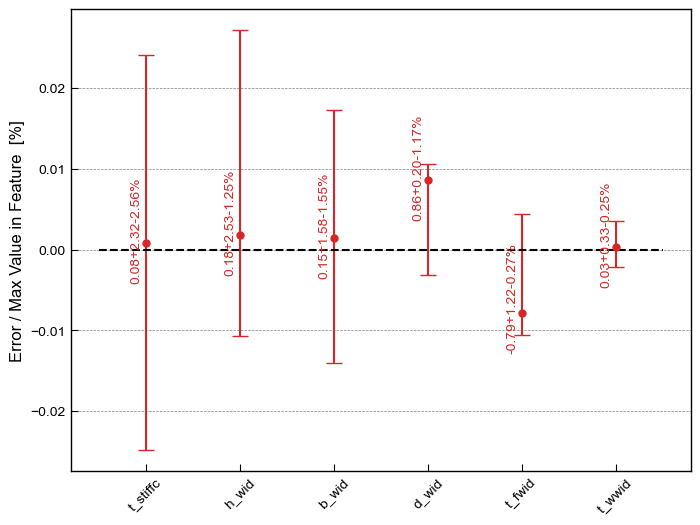

In [87]:
fig, ax = plt.subplots(figsize=(8, 6))

for i,feature in enumerate(features):
    error = reconstruction_deviation[:,i]

    error_bin_mean = error.mean()

    confidence = 50
    error_lower_val = np.percentile(error, (100 - confidence) / 2)
    error_upper_val = np.percentile(error, confidence + (100 - confidence) / 2)

    error_lower_bound = np.abs(error_bin_mean - error_lower_val)
    error_upper_bound = np.abs(error_upper_val - error_bin_mean)

    error_bounds = np.array([[error_lower_bound], [error_upper_bound]])

    ax.text(i-0.1, error_bin_mean-0.005, f"{error_bin_mean*100:.2f}+{error_upper_bound*100:.2f}-{error_lower_bound*100:.2f}%", ha='center', va='bottom', fontsize=10, color=plot_params.colors[3], rotation=90)
    ax.errorbar(i, error_bin_mean, yerr=error_bounds, fmt='o', color=plot_params.colors[3], markersize=5, capsize=6)

ax.set_ylabel('Error / Max Value in Feature  [%]')
ax.set_xticks(np.arange(len(features)))
ax.set_xticklabels(features, rotation=45)
ax.hlines(y=0, xmin=-0.5, xmax=len(features)-0.5, color='k', linestyle='--', label='Original')

plt.grid(True, axis='y', which='both', color='k', linestyle='--', linewidth=0.5, alpha=0.5)

plt.show()

#### Sample Error Metrics

Wonkyness function:

In [ ]:
def calculate_wonkyness(x_coords, y_coords):
    angles = []
    for i in range(len(x_coords) - 2):
        # Define the three consecutive points
        p1 = np.array([x_coords[i], y_coords[i]])
        p2 = np.array([x_coords[i+1], y_coords[i+1]])
        p3 = np.array([x_coords[i+2], y_coords[i+2]])

        # Vector of the first segment (p2 - p1)
        v1 = p2 - p1
        # Vector of the second segment (p3 - p2)
        v2 = p3 - p2

        # Calculate the angle between the two vectors using the dot product
        dot_product = np.dot(v1, v2)
        magn_v1 = np.linalg.norm(v1)
        magn_v2 = np.linalg.norm(v2)

        cos_theta = dot_product / (magn_v1 * magn_v2)
        # Ensure cos_theta is within the valid range [-1, 1] due to potential floating-point errors
        cos_theta = np.clip(cos_theta, -1.0, 1.0)
        angle = np.arccos(cos_theta)

        angles.append(angle)

    return np.var(angles) # sum

Feasibility functions and variables:

In [ ]:
def find_bins(datapoint, bounds, m):
    bin_widths = (bounds[:, 1] - bounds[:, 0]) / m
    if np.any(datapoint < bounds[:, 0]) or np.any(datapoint > bounds[:, 1]):
        return None

    bin_indices = np.zeros(len(datapoint), dtype=int)
    nonzero_mask = bin_widths > 0

    bin_indices[nonzero_mask] = ((datapoint[nonzero_mask] - bounds[nonzero_mask][:, 0]) / (bin_widths[nonzero_mask])).astype(int)
    bin_indices[nonzero_mask] = np.clip(bin_indices[nonzero_mask], 0, m - 1)
    
    return tuple(bin_indices)

def check_feasibility(datapoint, hypercubemap, bounds, m):
    bin_indices = find_bins(datapoint, bounds, m)

    if bin_indices is None:
        return 'Datapoint is out of bounds'
    
    closest_index = np.argmin(np.sum((hypercubemap - bin_indices) ** 2, axis=1))
    closest_bin = hypercubemap[closest_index]
    error = np.abs(closest_bin - bin_indices)

    feasibilty_degree = np.max(error)

    return feasibilty_degree, np.sum(error)/len(error)

hypercubemap = np.load(r"Saved Variables\hypercubemap.npy")

features_feasibility = ['h_x', 'b_x', 'tw_x', 'tf_x', 'A_x', 'Av_x', 'Iy_x',
       'Wely_x', 'Wply_x', 'fy_x', 'tau_x', 'Vpl_x', 'Mpl_x',
       'h_y', 'b_y', 'tw_y', 'tf_y', 'A_y', 'Av_y', 'Iy_y',
       'Wely_y', 'Wply_y', 'fy_y', 'tau_y', 'Vpl_y', 'Mpl_y',
       'Gamma', 't_stiffc', 'h_wid', 'b_wid', 'd_wid', 't_fwid', 't_wwid',
       't_stiffb', 'Offset', 
       'Cat_h', 'Cat_t_stiffc']

bounds = np.array([df[features_feasibility].min(), df[features_feasibility].max()]).T
m = int(np.max(hypercubemap))
bin_widths = (bounds[:, 1] - bounds[:, 0]) / m

Sample from CVAE and obtain metrics:

In [ ]:
n_samples = 20
sample_interaction_error = np.zeros((len(ids), n_samples))
sample_uncertainty = np.zeros((len(ids), n_samples))
sample_wonkyness = np.zeros((len(ids), n_samples))
sample_average_infeasibilities = np.zeros((len(ids), n_samples))
sample_feasibility_degrees = np.zeros((len(ids), n_samples))
base_interaction_curve_MRd = np.zeros((len(ids), 20))
base_interaction_curve_VRd = np.zeros((len(ids), 20))

for i,id in enumerate(ids):
    base_sample = df_choices.iloc[i:i+1].copy()

    if i % 10 == 0:
        print(f"{i/len(df_choices):.2%}")
    
    # Generate a base sample with the same features as the original sample
    generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)
    generated_features = sampling(model, base_sample, n_samples=n_samples, sample_distance_factor=1.0)
    generated_samples[features] = generated_features.values

    # Clip the generated samples to ensure they are within the bounds of the original data
    generated_samples = clip(generated_samples, df, features)

    # With forward model get the interaction curve of the base sample
    MRd_samples = np.zeros((n_samples, 20))
    VRd_samples = np.zeros((n_samples, 20))
    MRd_base, VRd_base, _ = model_forward.get_MV_interaction_prediction(base_sample.iloc[0],20)
    base_interaction_curve_MRd[i] = MRd_base
    base_interaction_curve_VRd[i] = VRd_base

    # Get uncertainty of samples
    mcd_mean, mcd_std, _ = model_forward.mc_dropout_uncertainty(generated_samples, num_samples=20)
    uncertainty = mcd_std / mcd_mean
    sample_uncertainty[i] = uncertainty.flatten()

    error = np.zeros(n_samples)
    wonkyness = np.zeros(n_samples)

    for k,sample in generated_samples.iterrows():
        # Get the interaction curve of the generated samples
        MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample,20)
        MRd_samples[k] = MRd_sample
        VRd_samples[k] = VRd_sample

        # Calculate the minimum distance from the base sample to the generated interaction curve
        preds = np.array(list(zip(MRd_sample, VRd_sample)))
        true = np.array(list(zip(base_sample['M_Rd'], base_sample['V_Rd'])))
        orthogonal_distance = np.min(np.linalg.norm(preds - true, axis=1))
        error[k] = orthogonal_distance / np.linalg.norm(true)

        # Calculate wonkyness of the interaction curve
        wonkyness[k] = calculate_wonkyness(MRd_sample, VRd_sample)

        # Check feasibility of the generated sample
        datapoint = sample[features_feasibility].values
        feasibility_degree, average_infeasibilty = check_feasibility(datapoint, hypercubemap, bounds, m)
        sample_average_infeasibilities[i,k] = average_infeasibilty
        sample_feasibility_degrees[i,k] = feasibility_degree

    sample_wonkyness[i] = wonkyness 
    sample_interaction_error[i] = error

0.00%
1.00%
2.00%
3.00%
4.00%
5.00%
6.00%
7.00%
8.00%
9.00%
10.00%
11.00%
12.00%
13.00%
14.00%
15.00%
16.00%
17.00%
18.00%
19.00%
20.00%
21.00%
22.00%
23.00%
24.00%
25.00%
26.00%
27.00%
28.00%
29.00%
30.00%
31.00%
32.00%
33.00%
34.00%
35.00%
36.00%
37.00%
38.00%
39.00%
40.00%
41.00%
42.00%
43.00%
44.00%
45.00%
46.00%
47.00%
48.00%
49.00%
50.00%
51.00%
52.00%
53.00%
54.00%
55.00%
56.00%
57.00%
58.00%
59.00%
60.00%
61.00%
62.00%
63.00%
64.00%
65.00%
66.00%
67.00%
68.00%
69.00%
70.00%
71.00%
72.00%
73.00%
74.00%
75.00%
76.00%
77.00%
78.00%
79.00%
80.00%
81.00%
82.00%
83.00%
84.00%
85.00%
86.00%
87.00%
88.00%
89.00%
90.00%
91.00%
92.00%
93.00%
94.00%
95.00%
96.00%
97.00%
98.00%
99.00%


#### Uncertainty of Base

In [262]:
mcd_mean, mcd_std, _ = model_forward.mc_dropout_uncertainty(df_choices,num_samples=100)
base_uncertainty = mcd_std / mcd_mean

#### Target Prediction Error of Base

In [263]:
target_predicted, _ = model_forward.predict(df_choices)
target_predicted = target_predicted.numpy()
target_truth = df_choices['target'].values.reshape(-1, 1)

base_target_error = np.abs(target_predicted - target_truth) / target_truth

#### Curve Cluster of Base

In [264]:
def normalize_curve(points):
    points = np.array(points)
    max_val = np.max(points) #max_vals = np.max(points, axis=0) (Both axes fixed on (1,0), (1,0)
    return points / max_val

def resample_curve(points, num_points=100):
    points = np.array(points)
    dist = np.cumsum(np.sqrt(np.sum(np.diff(points, axis=0)**2, axis=1)))
    dist = np.insert(dist, 0, 0)
    uniform_dist = np.linspace(0, dist[-1], num_points)
    interp_func = interp1d(dist, points, axis=0)
    return interp_func(uniform_dist)

def flatten_curve(points):
    return points.flatten()

def preprocess_curves(curves, num_points=100):
    return [flatten_curve(resample_curve(normalize_curve(c), num_points)) for c in curves]

def assign_new_data_to_clusters(new_curves, pca, kmeans):
    new_data = preprocess_curves(new_curves)
    reduced_new_data = pca.transform(new_data)
    cluster_labels = kmeans.predict(reduced_new_data)
    distances = np.min(kmeans.transform(reduced_new_data), axis=1)
    silhouette_avg = silhouette_score(reduced_new_data, cluster_labels)
    
    return cluster_labels, distances, silhouette_avg

with open(r"Saved Variables\interaction_pca.pkl", "rb") as file:
    pca = pickle.load(file)

with open(r"Saved Variables\interaction_kmeans.pkl", "rb") as file:
    kmeans = pickle.load(file)

In [52]:
def calculate_wonkyness(x_coords, y_coords):
    angles = []
    for i in range(len(x_coords) - 2):
        # Define the three consecutive points
        p1 = np.array([x_coords[i], y_coords[i]])
        p2 = np.array([x_coords[i+1], y_coords[i+1]])
        p3 = np.array([x_coords[i+2], y_coords[i+2]])

        # Vector of the first segment (p2 - p1)
        v1 = p2 - p1
        # Vector of the second segment (p3 - p2)
        v2 = p3 - p2

        # Calculate the angle between the two vectors using the dot product
        dot_product = np.dot(v1, v2)
        magn_v1 = np.linalg.norm(v1)
        magn_v2 = np.linalg.norm(v2)

        cos_theta = dot_product / (magn_v1 * magn_v2)
        # Ensure cos_theta is within the valid range [-1, 1] due to potential floating-point errors
        cos_theta = np.clip(cos_theta, -1.0, 1.0)
        angle = np.arccos(cos_theta)

        angles.append(angle)

    return np.std(angles)

In [265]:
base_interaction_curves = np.array(list(zip(base_interaction_curve_MRd,
                                       base_interaction_curve_VRd)))
base_interaction_curves = np.transpose(base_interaction_curves, (0, 2, 1))

In [266]:
base_cluster, base_cluster_distance,  _ = assign_new_data_to_clusters(base_interaction_curves, pca, kmeans)

### Summarize Error Metrics

In [282]:
columns = ['base_target_error', 
           'base_uncertainty', 
           'reconstruction_deviation', 
           'sample_interaction_error', 
           'sample_wonkyness', 
           'sample_uncertainty',
           'sample_average_infeasibilities',
           'sample_feasibility_degrees',
           'base_cluster',
           'base_cluster_distance']

In [283]:
error_summary = {'base_target_error': base_target_error.flatten(),
                'base_uncertainty': base_uncertainty.flatten(),
                'reconstruction_deviation': reconstruction_deviation.mean(axis=1),
                'sample_interaction_error': sample_interaction_error.mean(axis=1),
                'sample_wonkyness': sample_wonkyness.mean(axis=1),
                'sample_uncertainty': sample_uncertainty.mean(axis=1),
                'sample_average_infeasibilities': sample_average_infeasibilities.mean(axis=1),
                'sample_feasibility_degrees': sample_feasibility_degrees.mean(axis=1),
                'base_cluster': base_cluster,
                'base_cluster_distance': base_cluster_distance,}

In [ ]:
error_summary = pd.DataFrame(error_summary, columns=error_summary.keys(), index=ids)
error_summary.to_pickle(r"Saved Variables\error_summary.pkl")

### Analyse Error Metrics

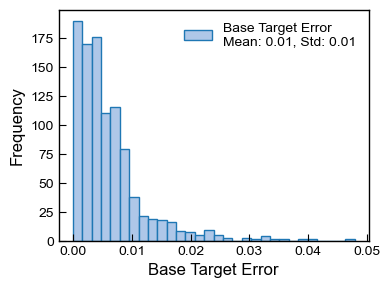

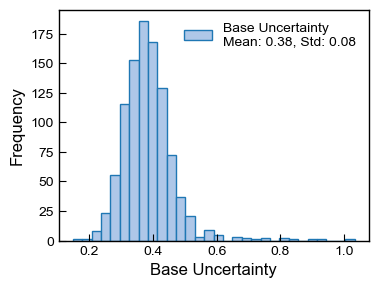

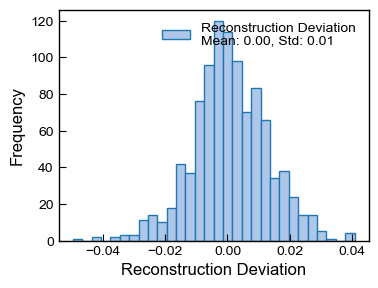

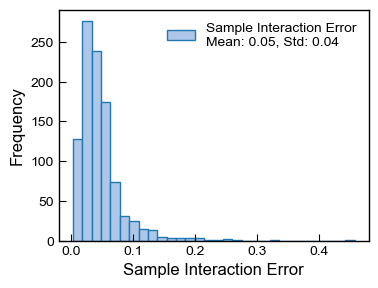

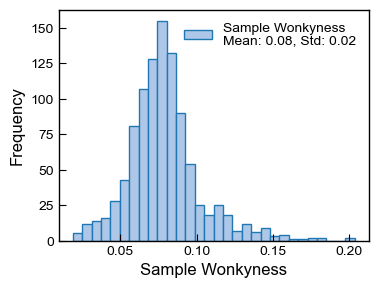

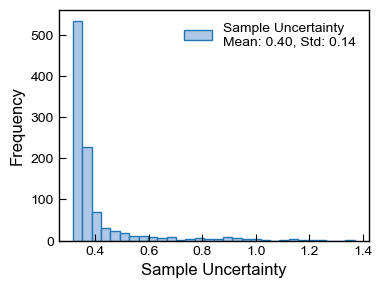

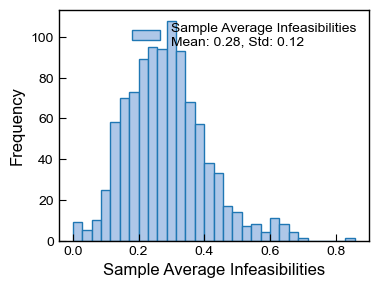

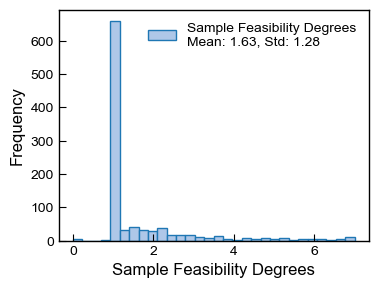

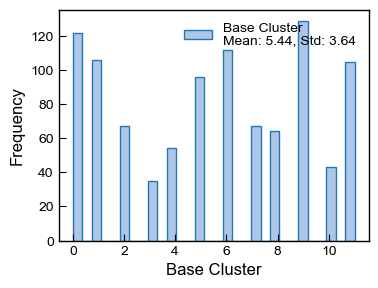

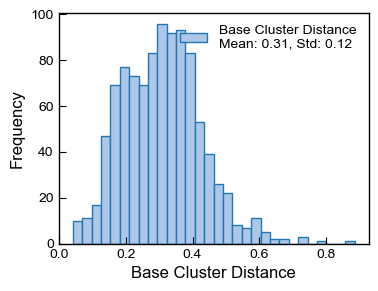

In [286]:
for error in columns:
    fig, ax = plt.subplots(figsize=(4, 3))
    ax.hist(error_summary[error], bins=30, 
            facecolor=plot_params.morecolors[1], 
            edgecolor=plot_params.morecolors[0],
            label=f'{error.replace("_", " ").title()}\nMean: {error_summary[error].mean():.2f}, Std: {error_summary[error].std():.2f}')

    ax.legend()
    ax.set_xlabel(error.replace("_", " ").title())
    ax.set_ylabel('Frequency')
    plt.show()

In [296]:
colors = [plot_params.morecolors[i] for i in error_summary['base_cluster']]

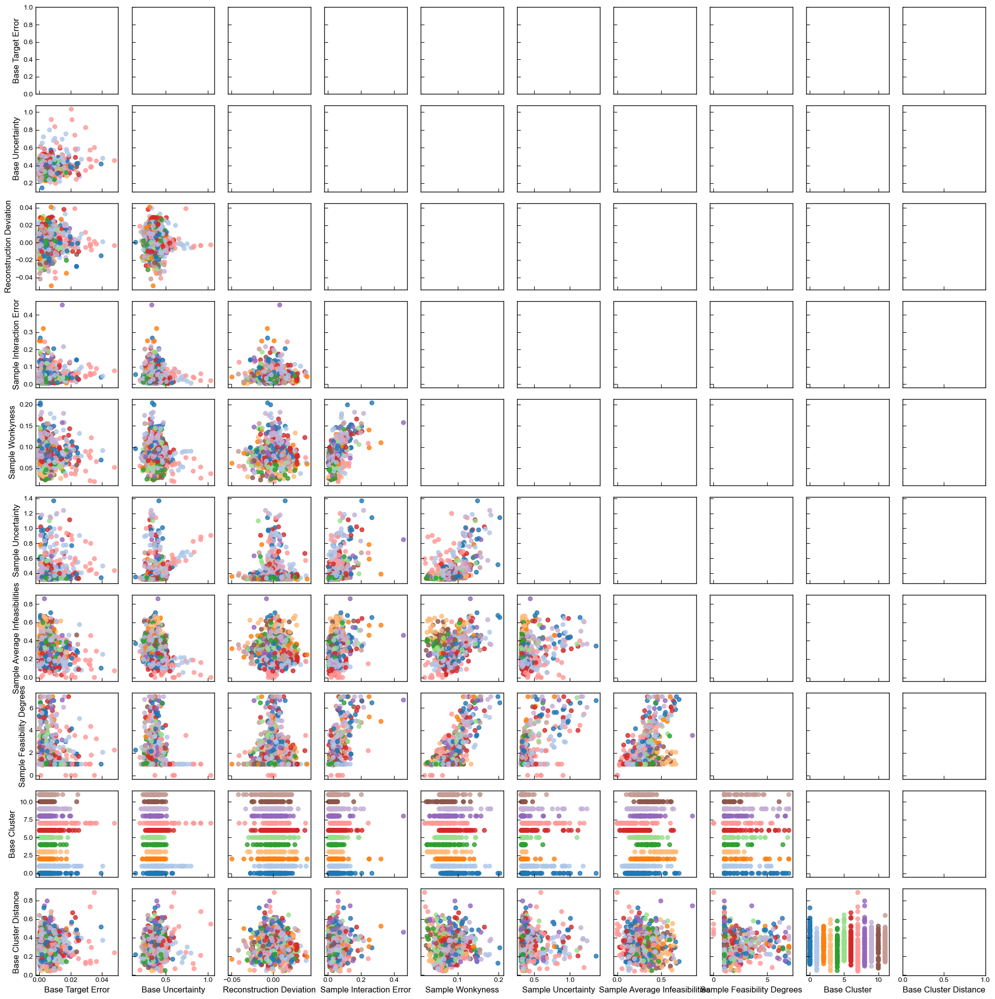

In [311]:
fig, axs = plt.subplots(len(columns), len(columns), figsize=(len(columns)*2, len(columns)*2), sharex='col', sharey='row')

for i in range(len(columns)):
    for j in range(i+1, len(columns)):
        ax = axs[j,i]
        ax.scatter(error_summary[columns[i]], error_summary[columns[j]], 
                   facecolor=colors,
                   edgecolor=colors,
                   alpha=0.8)

for i in range(len(columns)):
    ax = axs[i,0]
    ax.set_ylabel(columns[i].replace("_", " ").title())

    ax = axs[-1,i]
    ax.set_xlabel(columns[i].replace("_", " ").title())

plt.tight_layout()
plt.show()

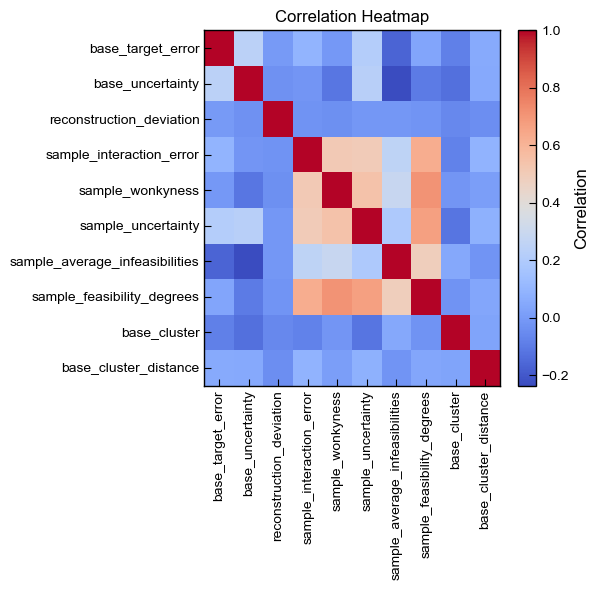

In [299]:
plt.figure(figsize=(6, 6))
plt.imshow(error_summary.corr().values, aspect='auto', cmap='coolwarm')
plt.colorbar(label='Correlation')
plt.xticks(ticks=np.arange(len(error_summary.columns)), labels=error_summary.columns, rotation=90)
plt.yticks(ticks=np.arange(len(error_summary.columns)), labels=error_summary.columns)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

### Feature Importance 

Get feature importance of metrics to target error.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

In [384]:
target_feature = 'sample_interaction_error'
target_features = 'base_target_error'
ignore_features = ['base_cluster', target_feature]
input_features = [col for col in columns if col not in ignore_features]

In [385]:
X = error_summary[input_features]
y = error_summary[target_feature]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

randomforest = RandomForestRegressor(random_state=42)
randomforest.fit(X_train, y_train)

importances = randomforest.feature_importances_
rf_features = X.columns
feature_importance = pd.Series(importances, index=rf_features).sort_values(ascending=False)

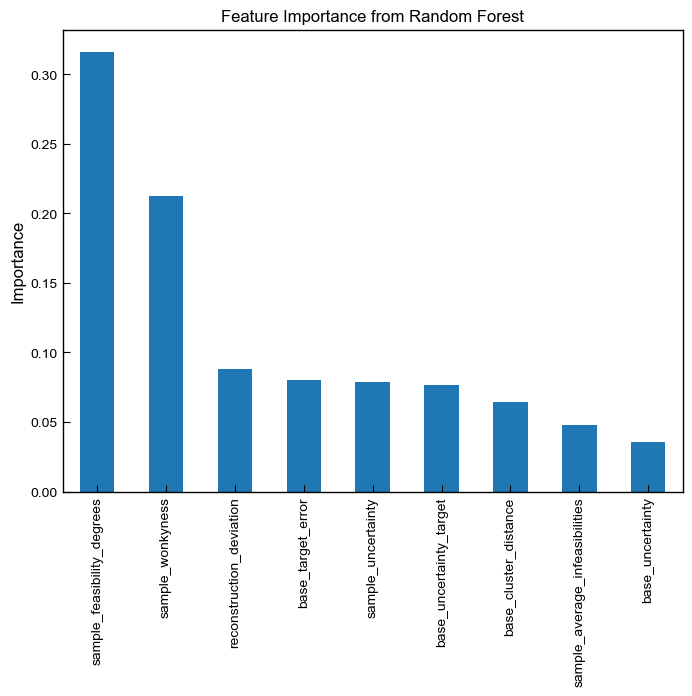

In [386]:
fig, ax = plt.subplots(figsize=(8, 6))

feature_importance.plot(kind='bar', ax=ax, color=plot_params.colors[0])

ax.set_title('Feature Importance from Random Forest')
ax.set_ylabel('Importance')

plt.show()

#### Feature Engineering

Try so assemble single score (not dependent on target truth), which associates with how well samples can be produced from a given base sample.

$$ \alpha = \sum  $$

In [365]:
from scipy.stats import norm

def to_lognormal(df):
    df_log_normal = pd.DataFrame(index=df.index)
    for col in df.columns:
        ranked = df[col].rank(method='average')
        uniform = (ranked - 0.5) / len(df)
        normal_scores = norm.ppf(uniform)
        lognormal = np.exp(normal_scores)
        df_log_normal[col] = lognormal
    return df_log_normal

X_lognormal = to_lognormal(X)
correlations = X.corrwith(y)

weighted = X_lognormal.multiply(correlations)
score = weighted.sum(axis=1)

In [366]:
correlations

base_uncertainty                 -0.014900
reconstruction_deviation         -0.026735
sample_wonkyness                  0.509272
sample_uncertainty                0.502064
sample_average_infeasibilities    0.254862
sample_feasibility_degrees        0.626795
base_cluster                     -0.077289
base_cluster_distance             0.088173
dtype: float64

In [367]:
score_rank = score.rank(ascending=False).values / len(score) * 100
score_normed = score.values / score.mean()

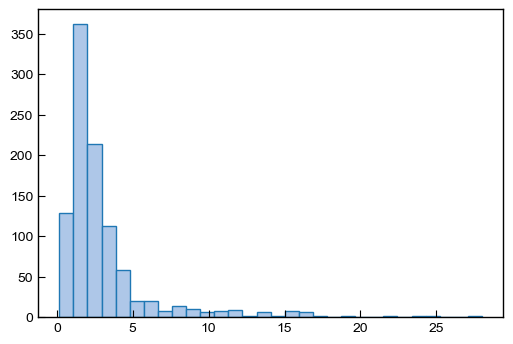

In [369]:
fig, ax = plt.subplots(figsize=(6, 4))

plt.hist(score, bins=30,
         facecolor=plot_params.morecolors[1], 
         edgecolor=plot_params.morecolors[0],
         label='Lognormal Weighted Score')

plt.show()

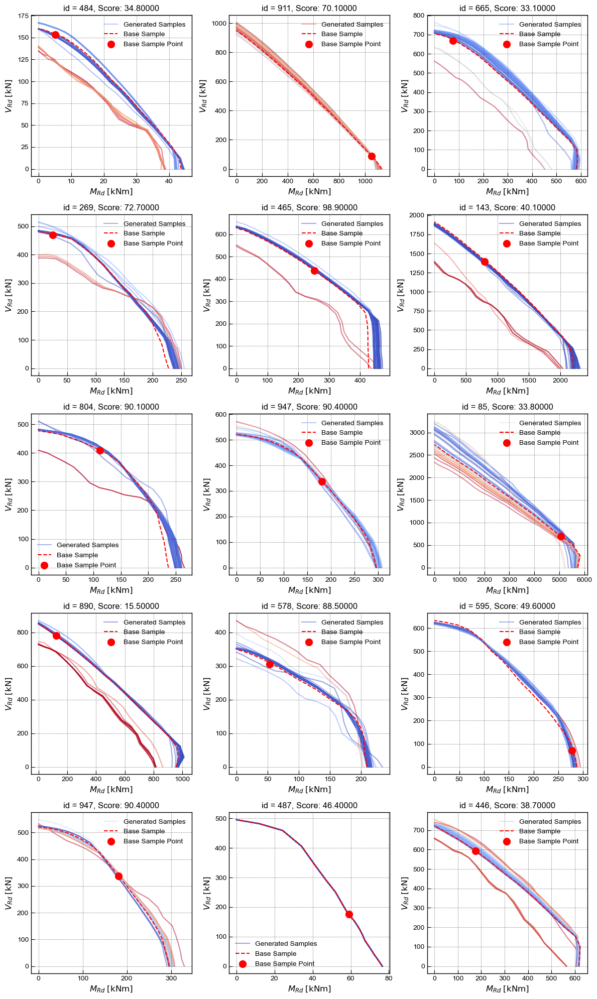

In [370]:
fig, axs = plt.subplots(5,3, figsize=(12, 20))

for i in range(5):
    for j in range(3):
        ax = axs[i,j]

        id = np.random.randint(0, len(df_choices), 1)[0]
        base_sample = df_choices.iloc[id:id+1].copy()
        n_samples = 50
        generated_samples = pd.concat([base_sample]*n_samples, ignore_index=True)

        generated_features = sampling(model, base_sample, n_samples=n_samples, sample_distance_factor=1.0)
        generated_samples[features] = generated_features.values

        generated_samples = clip(generated_samples, df, features)

        MRd_samples = np.zeros((n_samples, 20))
        VRd_samples = np.zeros((n_samples, 20))

        MRd_base, VRd_base, _ = model_forward.get_MV_interaction_prediction(base_sample.iloc[0],20)
        error = np.zeros(n_samples)

        for k,sample in generated_samples.iterrows():
            MRd_sample, VRd_sample, _ = model_forward.get_MV_interaction_prediction(sample,20)
            MRd_samples[k] = MRd_sample
            VRd_samples[k] = VRd_sample

            preds = np.array(list(zip(MRd_sample, VRd_sample)))
            true = np.array(list(zip(base_sample['M_Rd'], base_sample['V_Rd'])))
            orthogonal_distance = np.min(np.linalg.norm(preds - true, axis=1))
            error[k] = orthogonal_distance / np.linalg.norm(true)

        norm = mcolors.Normalize(vmin=np.min(error), vmax=np.max(error))
        cmap = plt.cm.coolwarm
        colors = cmap(norm(error))

        for k,(MRd, VRd) in enumerate(zip(MRd_samples, VRd_samples)):
            ax.plot(MRd, VRd, 
                    color=colors[k],                        
                    label=None if k > 0 else "Generated Samples",
                    alpha=0.5,
                    zorder=0)
            
            #ax.set_xlim([0, max(max(MRd),max(VRd))*1.1])
            #ax.set_ylim([0, max(max(MRd),max(VRd))*1.1])

        ax.plot(MRd_base, VRd_base,
                    color='red',
                    linestyle='--',
                    alpha=1.0,
                    zorder=2,
                    label="Base Sample")

        ax.scatter(base_sample['M_Rd'], base_sample['V_Rd'],
                    color='red',
                    marker='o',
                    s=100,
                    zorder=3,
                    label="Base Sample Point")

        ax.legend()
        ax.set_xlabel(r'$M_{Rd}$ $\mathrm{[kNm]}$')
        ax.set_ylabel(r'$V_{Rd}$ $\mathrm{[kN]}$')
        ax.grid(True, which='major', color='k', linestyle='--', linewidth=0.5, alpha=0.5)
        ax.set_title(f"id = {id}, Score: {score_rank[id]:.5f}")

        #ax.set_xlim([0,None])
        #ax.set_ylim([0,None])

plt.tight_layout()
plt.show()